In [0]:
!apt-get update
# Install a Drive FUSE wrapper.
# https://github.com/astrada/google-drive-ocamlfuse
!apt-get install -y -qq software-properties-common python-software-properties module-init-tools
!add-apt-repository -y ppa:alessandro-strada/ppa 2>&1 > /dev/null
!apt-get update -qq 2>&1 > /dev/null
!apt-get -y install -qq google-drive-ocamlfuse fuse tree

# Load the Drive helper and mount
from google.colab import drive

# This will prompt for authorization.
drive.mount('/content/drive', force_remount=True)

Ign:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Ign:2 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release
Hit:4 http://security.ubuntu.com/ubuntu bionic-security InRelease
Hit:5 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Hit:6 http://archive.ubuntu.com/ubuntu bionic InRelease
Hit:7 http://ppa.launchpad.net/alessandro-strada/ppa/ubuntu bionic InRelease
Hit:9 http://archive.ubuntu.com/ubuntu bionic-updates InRelease
Hit:10 http://archive.ubuntu.com/ubuntu bionic-backports InRelease
Hit:11 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease
Hit:13 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran35/ InRelease
Hit:14 http://ppa.launchpad.net/marutter/c2d4u3.5/ubuntu bionic InRelease
Reading package lists... Done
E: Package 'python-softw

# Inspect Food Trained Model

Code and visualizations to test, debug, and evaluate the Mask R-CNN model.

In [0]:
!pwd

import os
os.chdir('/content/drive/My Drive/My Research/T h e s i s')

!pwd

/content
/content/drive/My Drive/My Research/T h e s i s


In [0]:
!pip install wandb
!wandb login 15c938b8ba2d1b542f6a233f946daaa544208b4a

     |████████████████████████████████| 1.3MB 4.7MB/s 
     |████████████████████████████████| 71kB 29.9MB/s 
     |████████████████████████████████| 450kB 24.4MB/s 
     |████████████████████████████████| 102kB 33.1MB/s 
     |████████████████████████████████| 235kB 45.0MB/s 
     |████████████████████████████████| 92kB 36.2MB/s 
     |████████████████████████████████| 71kB 31.6MB/s 
     |████████████████████████████████| 256kB 53.3MB/s 
     |████████████████████████████████| 184kB 34.2MB/s 
  Stored in directory: /root/.cache/pip/wheels/3f/eb/fd/69e5177f67b505e44acbd1aedfbe44b91768ee0c4cd5636576
  Stored in directory: /root/.cache/pip/wheels/a7/8d/65/a3247f500d675d80a01e4d2f0ee44fe99f1faef575bc2a1664
  Stored in directory: /root/.cache/pip/wheels/c0/08/48/bb468e57d688ea6fa40a450d88d7d9f5fb3c955510077da743
  Stored in directory: /root/.cache/pip/wheels/61/1d/d0/04cfe495619be2095eb8d89a31c42adb4e42b76495bc8f784c
  Stored in directory: /root/.cache/pip/wheels/0b/04/79/c3b0c3a0266a3cb4

Appending key for api.wandb.ai to your netrc file: /root/.netrc
Successfully logged in to Weights & Biases!


In [0]:
import cv2
import sys
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import skimage
import glob
from mrcnn.model import log
import keras

# Root directory of the project
ROOT_DIR = os.getcwd()

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log

import custom_multiclass as custom 

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

#custom_WEIGHTS_PATH = "/content/drive/My Drive/My Research/T h e s i s/logs/makanan20190217T2239/mask_rcnn_makanan_0040.h5"  # TODO: update this path
custom_WEIGHTS_PATH = "/content/drive/My Drive/My Research/T h e s i s/logs/makanan-20190227T0700/mask_rcnn_makanan_0040.h5"

Using TensorFlow backend.


W&B Run: https://app.wandb.ai/rezayoga/my-thesis-food-image-calories-based-on-instance-segmentation/runs/g13atcp6
Call `%%wandb` in the cell containing your training loop to display live results.


In [0]:
# !pip install Keras==2.0.8
# !pip install Keras

In [0]:
print (keras.__version__)

2.2.4


## Configurations

In [0]:
config = custom.CustomConfig()
custom_DIR = os.path.join(ROOT_DIR, "dataset")

In [0]:
# Override the training configurations with a few
# changes for inferencing.
# DEFAULT
class InferenceConfig(config.__class__):
    # Run detection on one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                19
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [0]:
# Override the training configurations with a few
# changes for inferencing.
'''
class InferenceConfig(config.__class__):
    # Run detection on one image at a time
    # Give the configuration a recognizable name
    NAME = "part"
    # BATCH_SIZE = 1
    # We use a GPU with 12GB memory, which can fit two images.
    # Adjust down if you use a smaller GPU.
    IMAGES_PER_GPU = 2
    # Number of classes (including background)
    NUM_CLASSES = 1 + 5  # Background + bag +top +boots

    # Number of training steps per epoch
    STEPS_PER_EPOCH = 100

    # Skip detections with < 90% confidence
    DETECTION_MIN_CONFIDENCE = 0.9

    IMAGE_MIN_DIM = 1024
    IMAGE_MAX_DIM = 1024

    #TRAIN_ROIS_PER_IMAGE = 200

config = InferenceConfig()
config.display()
'''

# memory footprint support libraries/code
!ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
!pip install gputil
!pip install psutil
!pip install humanize
import psutil
import humanize
import os
import GPUtil as GPU
GPUs = GPU.getGPUs()
# XXX: only one GPU on Colab and isn’t guaranteed
gpu = GPUs[0]
def printm():
  process = psutil.Process(os.getpid())
  print("Gen RAM Free: " + humanize.naturalsize( psutil.virtual_memory().available ), " | Proc size: " + humanize.naturalsize( process.memory_info().rss))
  print("GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB".format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))

printm()

  Stored in directory: /root/.cache/pip/wheels/3d/77/07/80562de4bb0786e5ea186911a2c831fdd0018bda69beab71fd
Successfully built gputil
Gen RAM Free: 12.8 GB  | Proc size: 357.3 MB
GPU RAM Free: 15079MB | Used: 0MB | Util   0% | Total 15079MB


## Notebook Preferences

In [0]:
# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
DEVICE = "/gpu:0"  # /cpu:0 or /gpu:0

# Inspect the model in training or inference modes
# values: 'inference' or 'training'
# TODO: code for 'training' test mode not ready yet
TEST_MODE = "inference"

In [0]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

## Load Validation Dataset

In [0]:
# Load validation dataset
dataset = custom.CustomDataset()
dataset.load_custom(custom_DIR, "val")

# Must call before using the dataset
dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

['tahu goreng', 'tahu bacem', 'tahu bacem', 'roti tawar', 'tahu goreng', 'tempe bacem', 'piring']
['roti tawar', 'tahu goreng', 'tahu goreng', 'tempe bacem', 'tahu bacem', 'tahu bacem', 'tahu goreng', 'piring']
['tempe goreng', 'tempe bacem', 'tahu bacem', 'tahu goreng', 'roti tawar', 'tahu goreng', 'tahu goreng', 'tahu bacem', 'piring']
['tempe goreng', 'tempe bacem', 'tahu goreng', 'roti tawar', 'tahu bacem', 'tempe goreng', 'tempe goreng', 'tahu goreng', 'piring']
['roti tawar', 'roti tawar', 'piring']
['roti tawar', 'tempe bacem', 'roti tawar', 'tahu goreng', 'piring']
['tahu goreng', 'roti tawar', 'tempe goreng', 'piring']
['roti tawar', 'tahu goreng', 'roti tawar', 'tempe bacem', 'tempe goreng', 'piring']
['roti tawar', 'roti tawar', 'tempe goreng', 'tempe goreng', 'tahu goreng', 'tahu goreng', 'tempe bacem', 'piring']
['tahu goreng', 'tempe goreng', 'tempe bacem', 'piring']
['tempe bacem', 'piring']
['tempe goreng', 'piring']
['tempe goreng', 'tahu bacem', 'piring']
['tahu goren

## Load Model

In [0]:
# Create model in inference mode
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR,
                              config=config)

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.


In [0]:
# load the last model you trained
# weights_path = model.find_last()[1]

# Load weights
print("Loading weights ", custom_WEIGHTS_PATH)
model.load_weights(custom_WEIGHTS_PATH, by_name=True)

Loading weights  /content/drive/My Drive/My Research/T h e s i s/logs/makanan-20190227T0700/mask_rcnn_makanan_0040.h5
Re-starting from epoch 40


In [0]:
from importlib import reload # was constantly changin the visualization, so I decided to reload it instead of notebook
reload(visualize)

<module 'mrcnn.visualize' from '/content/drive/My Drive/My Research/T h e s i s/mrcnn/visualize.py'>

# Run Detection on Images

image ID: makanan.iphone_00021.jpg (6) /content/drive/My Drive/My Research/T h e s i s/dataset/val/iphone_00021.jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 19)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
gt_class_id              shape: (4,)                  min:    1.00000  max:    6.00000  int64
gt_bbox                  shape: (4, 4)                min:  179.00000  max:  855.00000  int32
gt_mask                  shape: (1024, 1024, 4)       min:    0.00000  max:    1.00000  bool


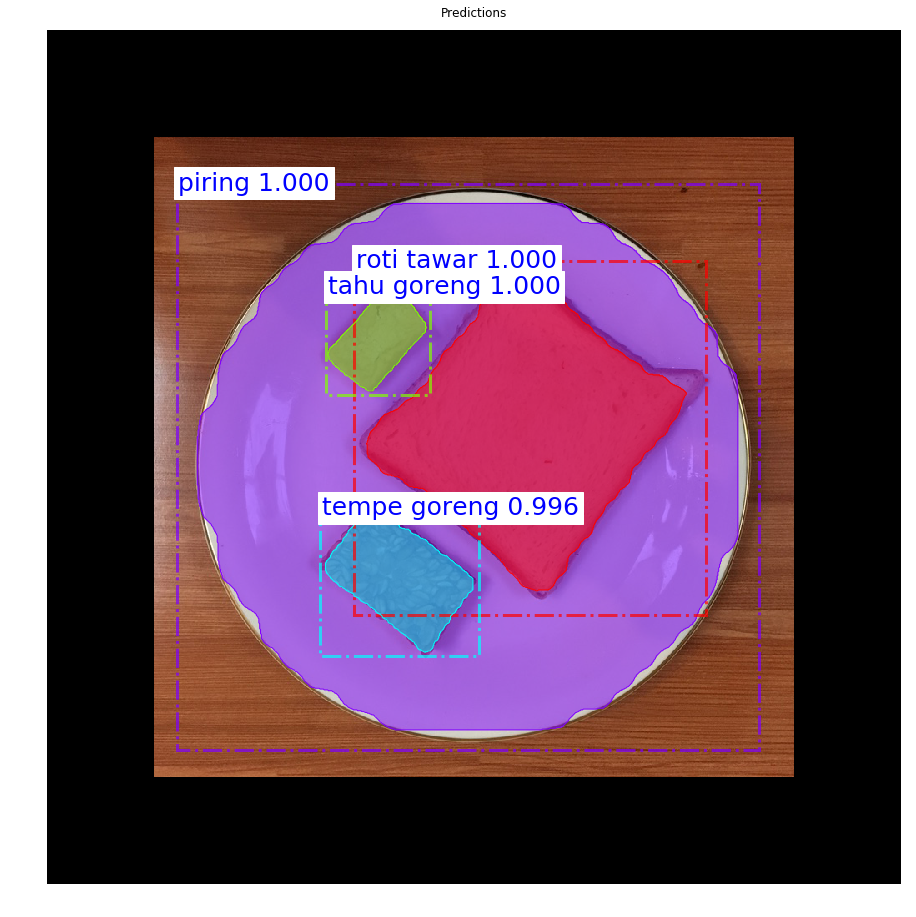

In [0]:
#image_id = random.choice(dataset.image_ids)
#image_id = dataset.image_ids[39]
image_id = dataset.image_ids[6]
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
info = dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))
# Run object detection
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset.class_names, r['scores'], ax=ax,
                            title="Predictions")
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

### Precision-Recall

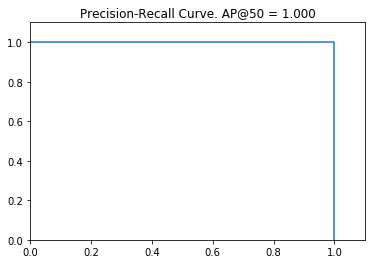

In [0]:
# Draw precision-recall curve
AP, precisions, recalls, overlaps = utils.compute_ap(gt_bbox, gt_class_id, gt_mask,  r['rois'], r['class_ids'], r['scores'], r['masks'])
visualize.plot_precision_recall(AP, precisions, recalls)

/usr/local/lib/python3.6/dist-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


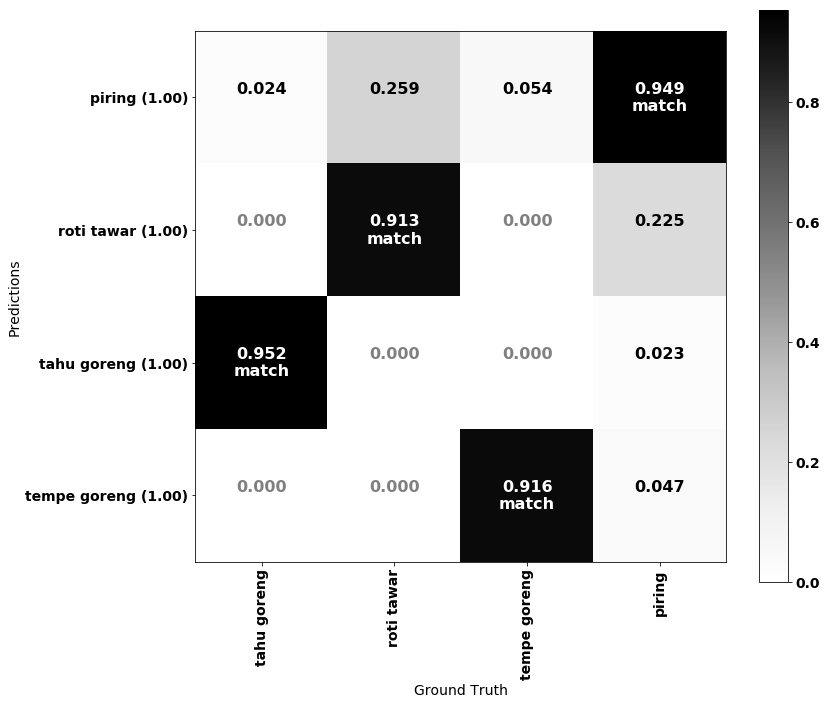

In [0]:
# Grid of ground truth objects and their predictions
visualize.plot_overlaps(gt_class_id, r['class_ids'], r['scores'],
                        overlaps, dataset.class_names, threshold=0.50)

### Compute mAP @ IoU=50 on Batch of Images

In [0]:
# Compute VOC-style Average Precision
def compute_batch_ap(image_ids):
    AP50s = []
    AP75s = []
    APPrimaries = []
    i = 0
    for image_id in image_ids:
        # Load image
        image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset, config,
                                   image_id, use_mini_mask=False)
        
        
        print (image_id)
        
        # Run object detection
        results = model.detect([image], verbose=0)
        # Compute AP
        r = results[0]
        
        AP0 = utils.compute_ap_range(gt_bbox, gt_class_id, gt_mask,  r['rois'], r['class_ids'], r['scores'], r['masks'])
        
        AP50, precisions50, recalls50, overlaps50 = utils.compute_ap(gt_bbox, gt_class_id, gt_mask,  r['rois'], r['class_ids'], r['scores'], r['masks'], iou_threshold=0.5)
        AP75, precisions75, recalls75, overlaps75 = utils.compute_ap(gt_bbox, gt_class_id, gt_mask,  r['rois'], r['class_ids'], r['scores'], r['masks'], iou_threshold=0.75)
        #visualize.plot_precision_recall(AP0, precisions, recalls)
        
        #overlaps_mask = utils.compute_overlaps_masks(gt_mask, r['masks']).mean()
        #print('\noverlaps_mask[' + str(i) + ']: ' + str(overlaps_mask))
        
        info = dataset.image_info[image_id]
        print("\n\nimage ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))
        print('\n\nAP50[' + str(i) + ']: ' + str(AP50) + ' ~ AP0[' + str(i) + ']: ' + str(AP0) + ' ~ AP75[' + str(i) + ']: ' + str(AP75))
        #print('\n\nprecisions[' + str(i) + ']: ' + str(precisions))
        #print('\n\nprecisions.shape[' + str(i) + ']: ' + str(precisions.shape))
        #print('\n\nrecalls[' + str(i) + ']: ' + str(recalls))
        #print('\n\nrecalls.shape[' + str(i) + ']: ' + str(recalls.shape))
        #print('\n\noverlaps[' + str(i) + ']: ' + str(overlaps))
        #print('\n\noverlaps.shape[' + str(i) + ']: ' + str(overlaps.shape))
        
        AP50s.append(AP50)
        AP75s.append(AP75)
        APPrimaries.append(AP0)
        
        i=i+1
        print('\n-----------------------------------------------------------------------------------------------------')
        
    return AP50s, AP75s, APPrimaries

#image_id = dataset.image_ids[33]
# Pick a set of random images
#image_ids = np.random.choice(dataset.image_ids, 5)
image_ids = dataset.image_ids
#image_ids = [(image_id)]
AP50s, AP75s, APPrimaries = compute_batch_ap(image_ids)
print("\n\nmAP @ IoU=.50:.05:.95 : ", np.mean(APPrimaries))
print("\n\nmAP @ IoU=.50: ", np.mean(AP50s))
print("\n\nmAP @ IoU=.75: ", np.mean(AP75s))

0
AP @0.50:	 1.000
AP @0.55:	 1.000
AP @0.60:	 1.000
AP @0.65:	 1.000
AP @0.70:	 1.000
AP @0.75:	 1.000
AP @0.80:	 1.000
AP @0.85:	 1.000
AP @0.90:	 1.000
AP @0.95:	 0.000
AP @0.50-0.95:	 0.900


image ID: makanan.iphone_00002.jpg (0) /content/drive/My Drive/My Research/T h e s i s/dataset/val/iphone_00002.jpg


AP50[0]: 1.0 ~ AP0[0]: 0.9 ~ AP75[0]: 1.0

-----------------------------------------------------------------------------------------------------
1
AP @0.50:	 1.000
AP @0.55:	 1.000
AP @0.60:	 1.000
AP @0.65:	 1.000
AP @0.70:	 1.000
AP @0.75:	 1.000
AP @0.80:	 1.000
AP @0.85:	 1.000
AP @0.90:	 1.000
AP @0.95:	 0.016
AP @0.50-0.95:	 0.902


image ID: makanan.iphone_00006.jpg (1) /content/drive/My Drive/My Research/T h e s i s/dataset/val/iphone_00006.jpg


AP50[1]: 1.0 ~ AP0[1]: 0.9015625 ~ AP75[1]: 1.0

-----------------------------------------------------------------------------------------------------
2
AP @0.50:	 1.000
AP @0.55:	 1.000
AP @0.60:	 1.000
AP @0.65:	 1.000
AP @0.

In [0]:
# !git clone --branch v2.1 --single-branch https://github.com/matterport/Mask_RCNN.git  '/content/drive/My Drive/My Research/Mask_RCNN_2.1'

In [0]:
# !git clone https://github.com/pdollar/coco.git '/content/drive/My Drive/My Research/T h e s i s/coco'

In [0]:
#!cd coco/PythonAPI
#os.chdir('/content/drive/My Drive/My Research/T h e s i s/coco/PythonAPI')
#!ls -ahl
#!pwd

In [0]:
#!make
#!sudo make install
#!sudo python setup.py install

In [0]:
#!cd coco/PythonAPI
#os.chdir('/content/drive/My Drive/My Research/T h e s i s')
#!ls -ahl
#!pwd

In [0]:
#!python coco.py evaluate --dataset='/content/drive/My Drive/My Research/T h e s i s/dataset/' --model="/content/drive/My Drive/My Research/T h e s i s/logs/makanan-20190227T0700/mask_rcnn_makanan_0040.h5"

## Step by Step Prediction

## Stage 1: Region Proposal Network

The Region Proposal Network (RPN) runs a lightweight binary classifier on a lot of boxes (anchors) over the image and returns object/no-object scores. Anchors with high *objectness* score (positive anchors) are passed to the stage two to be classified.

Often, even positive anchors don't cover objects fully. So the RPN also regresses a refinement (a delta in location and size) to be applied to the anchors to shift it and resize it a bit to the correct boundaries of the object.

### 1.a RPN Targets

The RPN targets are the training values for the RPN. To generate the targets, we start with a grid of anchors that cover the full image at different scales, and then we compute the IoU of the anchors with ground truth object. Positive anchors are those that have an IoU >= 0.7 with any ground truth object, and negative anchors are those that don't cover any object by more than 0.3 IoU. Anchors in between (i.e. cover an object by IoU >= 0.3 but < 0.7) are considered neutral and excluded from training.

To train the RPN regressor, we also compute the shift and resizing needed to make the anchor cover the ground truth object completely.

In [0]:
# Generate RPN trainig targets
# target_rpn_match is 1 for positive anchors, -1 for negative anchors
# and 0 for neutral anchors.
target_rpn_match, target_rpn_bbox = modellib.build_rpn_targets(
    image.shape, model.anchors, gt_class_id, gt_bbox, model.config)
log("target_rpn_match", target_rpn_match)
log("target_rpn_bbox", target_rpn_bbox)

positive_anchor_ix = np.where(target_rpn_match[:] == 1)[0]
negative_anchor_ix = np.where(target_rpn_match[:] == -1)[0]
neutral_anchor_ix = np.where(target_rpn_match[:] == 0)[0]
positive_anchors = model.anchors[positive_anchor_ix]
negative_anchors = model.anchors[negative_anchor_ix]
neutral_anchors = model.anchors[neutral_anchor_ix]
log("positive_anchors", positive_anchors)
log("negative_anchors", negative_anchors)
log("neutral anchors", neutral_anchors)

# Apply refinement deltas to positive anchors
refined_anchors = utils.apply_box_deltas(
    positive_anchors,
    target_rpn_bbox[:positive_anchors.shape[0]] * model.config.RPN_BBOX_STD_DEV)
log("refined_anchors", refined_anchors, )


target_rpn_match         shape: (261888,)             min:   -1.00000  max:    1.00000  int32
target_rpn_bbox          shape: (256, 4)              min:   -1.78896  max:    1.45508  float64
positive_anchors         shape: (7, 4)                min:  192.00000  max:  832.00000  float64
negative_anchors         shape: (249, 4)              min:  -26.50967  max: 1082.50967  float64
neutral anchors          shape: (261632, 4)           min: -362.03867  max: 1322.03867  float64
refined_anchors          shape: (7, 4)                min:  179.00000  max:  855.00000  float32


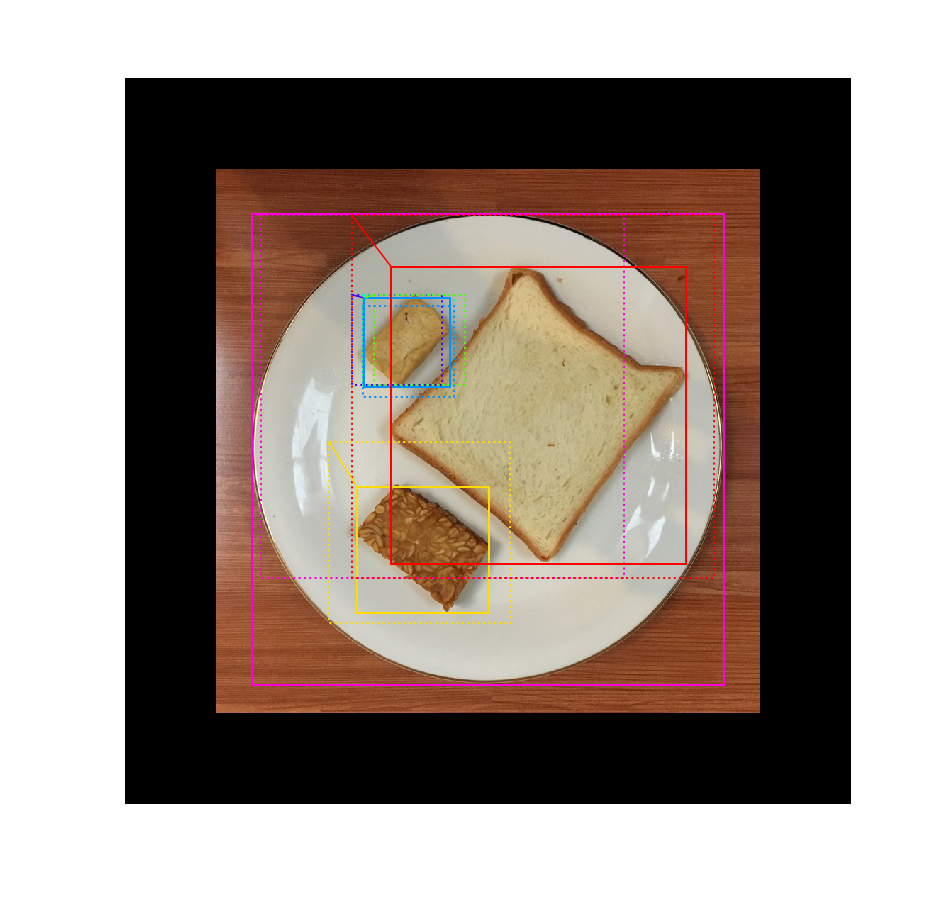

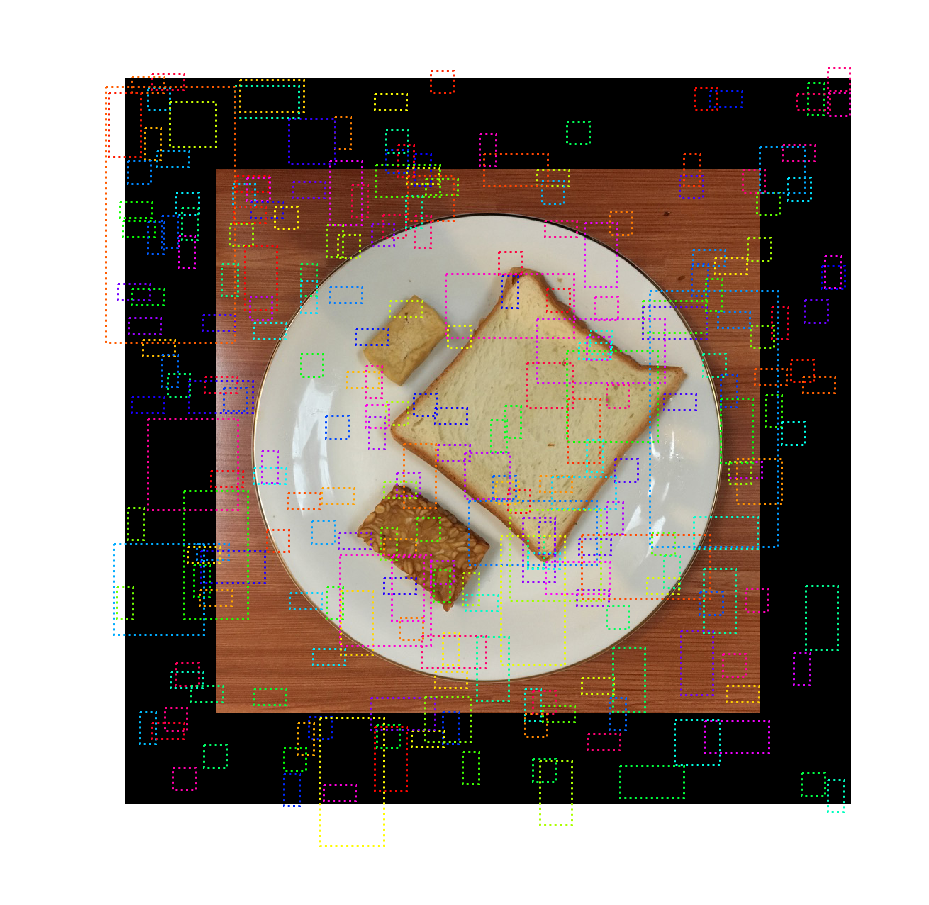

In [0]:
# Display positive anchors before refinement (dotted) and
# after refinement (solid).

visualize.draw_boxes(image, boxes=positive_anchors, refined_boxes=refined_anchors, ax=get_ax())
visualize.draw_boxes(image, boxes=negative_anchors, ax=get_ax())

In [0]:
#!pip install tensorflow-gpu==1.8
#!pip install tensorflow_hub

#!pip uninstall tensorflow-gpu
#!pip install tensorflow-gpu==1.4

In [0]:
import tensorflow as tf
print(tf.__version__)

1.13.1


### 1.b RPN Predictions

Here we run the RPN graph and display its predictions.

In [0]:
'''
# Run RPN sub-graph
pillar = model.keras_model.get_layer("ROI").output  # node to start searching from

# TF 1.4 introduces a new version of NMS. Search for both names to support TF 1.3 and 1.4
nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV2:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV3:0")

rpn = model.run_graph([image], [
    ("rpn_class", model.keras_model.get_layer("rpn_class").output),
    ("pre_nms_anchors", model.ancestor(pillar, "ROI/pre_nms_anchors:0")),
    ("refined_anchors", model.ancestor(pillar, "ROI/refined_anchors:0")),
    ("refined_anchors_clipped", model.ancestor(pillar, "ROI/refined_anchors_clipped:0")),
    ("post_nms_anchor_ix", nms_node),
    ("proposals", model.keras_model.get_layer("ROI").output),
])
'''

# Run RPN sub-graph
pillar = model.keras_model.get_layer("ROI").output  # node to start searching from

# TF 1.4 and 1.9 introduce new versions of NMS. Search for all names to support TF 1.3~1.10
nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV2:0")
if nms_node is None: #TF 1.9-1.10
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV3:0")

rpn = model.run_graph([image], [
    ("rpn_class", model.keras_model.get_layer("rpn_class").output),
    ("pre_nms_anchors", model.ancestor(pillar, "ROI/pre_nms_anchors:0")),
    ("refined_anchors", model.ancestor(pillar, "ROI/refined_anchors:0")),
    ("refined_anchors_clipped", model.ancestor(pillar, "ROI/refined_anchors_clipped:0")),
    ("post_nms_anchor_ix", nms_node),
    ("proposals", model.keras_model.get_layer("ROI").output),
])

rpn_class                shape: (1, 261888, 2)        min:    0.00000  max:    1.00000  float32
pre_nms_anchors          shape: (1, 6000, 4)          min:   -0.35390  max:    1.29134  float32
refined_anchors          shape: (1, 6000, 4)          min: -7338.18457  max: 7339.32910  float32
refined_anchors_clipped  shape: (1, 6000, 4)          min:    0.00000  max:    1.00000  float32
post_nms_anchor_ix       shape: (44,)                 min:    0.00000  max:  803.00000  int32
proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32


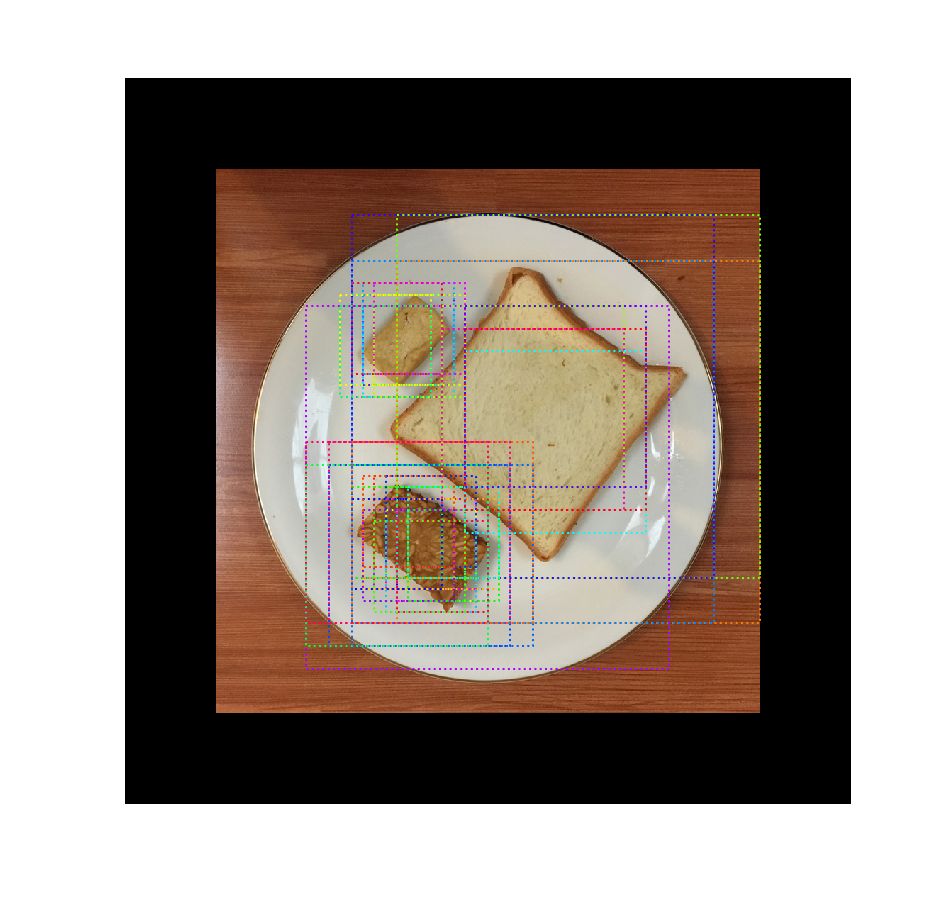

In [0]:
'''
# Show top anchors by score (before refinement)
limit = 50
sorted_anchor_ids = np.argsort(rpn['rpn_class'][:,:,1].flatten())[::-1]
visualize.draw_boxes(image, boxes=model.anchors[sorted_anchor_ids[:limit]], ax=get_ax())
'''

# Show top anchors by score (before refinement)
limit = 50
sorted_anchor_ids = np.argsort(rpn['rpn_class'][:,:,1].flatten())[::-1]
visualize.draw_boxes(image, boxes=model.anchors[sorted_anchor_ids[:limit]], ax=get_ax())

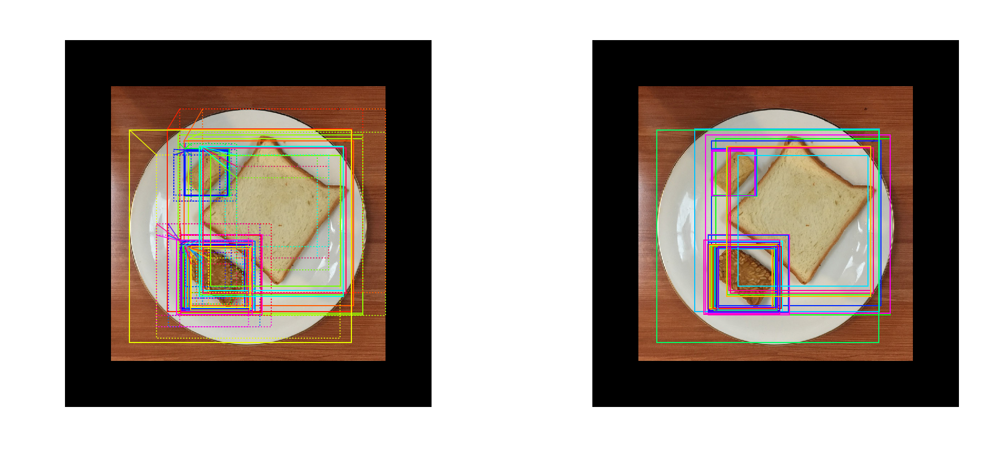

In [0]:
'''
# Show top anchors with refinement. Then with clipping to image boundaries
#limit = 550
#ax = get_ax(1, 2)
#visualize.draw_boxes(image, boxes=rpn["pre_nms_anchors"][0, :limit], refined_boxes=rpn["refined_anchors"][0, :limit], ax=ax[0])
#visualize.draw_boxes(image, refined_boxes=rpn["refined_anchors_clipped"][0, :limit], ax=ax[1])

limit = 50
h, w = config.IMAGE_SHAPE[:2]
pre_nms_anchors = rpn["pre_nms_anchors"][0, :limit] * np.array([h, w, h, w])
refined_anchors = rpn["refined_anchors"][0, :limit] * np.array([h, w, h, w])
refined_anchors_clipped = rpn["refined_anchors_clipped"][0, :limit] * np.array([h, w, h, w])

# Show top anchors with refinement. Then with clipping to image boundaries
ax = get_ax(1, 2)
visualize.draw_boxes(image, boxes=pre_nms_anchors,refined_boxes=refined_anchors, ax=ax[0])
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped, ax=ax[1])
'''



# Show top anchors with refinement. Then with clipping to image boundaries
limit = 50
ax = get_ax(1, 2)
pre_nms_anchors = utils.denorm_boxes(rpn["pre_nms_anchors"][0], image.shape[:2])
refined_anchors = utils.denorm_boxes(rpn["refined_anchors"][0], image.shape[:2])
refined_anchors_clipped = utils.denorm_boxes(rpn["refined_anchors_clipped"][0], image.shape[:2])
visualize.draw_boxes(image, boxes=pre_nms_anchors[:limit], refined_boxes=refined_anchors[:limit], ax=ax[0])
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[:limit], ax=ax[1])

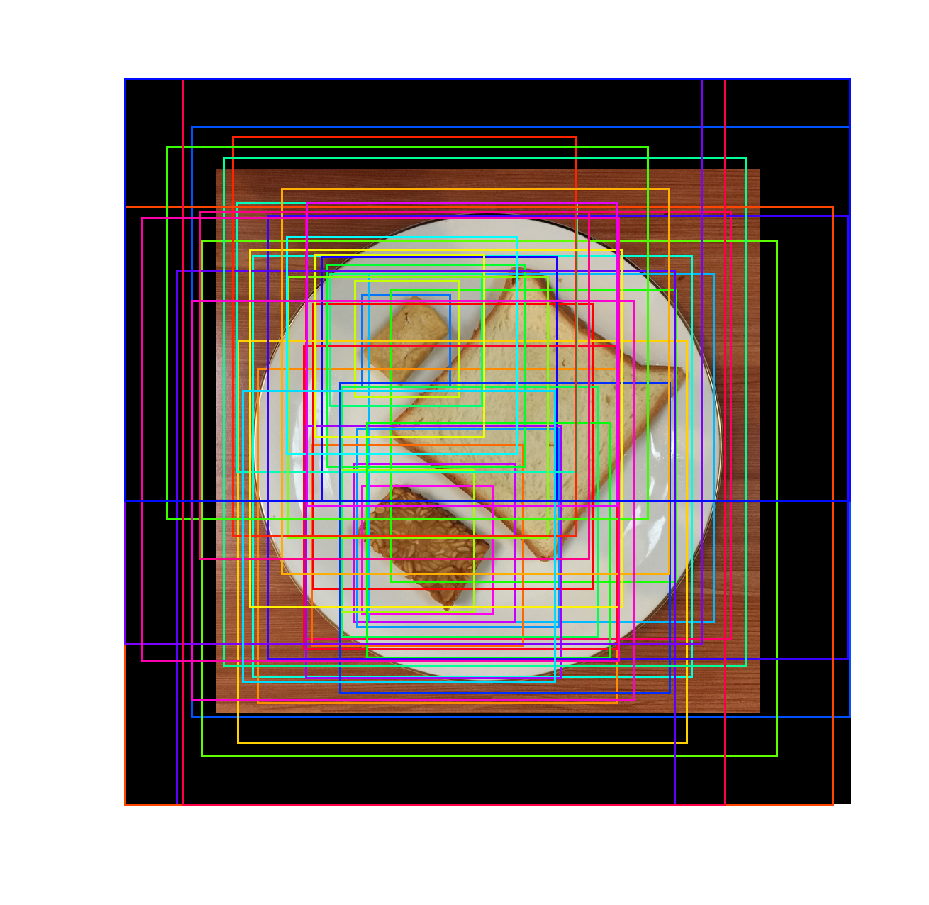

In [0]:
# Show refined anchors after non-max suppression
'''
limit = 50
h, w = config.IMAGE_SHAPE[:2]
pre_nms_anchors = rpn["pre_nms_anchors"][0, :limit] * np.array([h, w, h, w])
refined_anchors = rpn["refined_anchors"][0, :limit] * np.array([h, w, h, w])
refined_anchors_clipped = rpn["refined_anchors_clipped"][0, :limit] * np.array([h, w, h, w])

# Show top anchors with refinement. Then with clipping to image boundaries
ax = get_ax(1, 2)
visualize.draw_boxes(image, boxes=pre_nms_anchors,refined_boxes=refined_anchors, ax=ax[0])
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped, ax=ax[1])

'''
# Show refined anchors after non-max suppression
limit = 50
ixs = rpn["post_nms_anchor_ix"][:limit]
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[ixs], ax=get_ax())

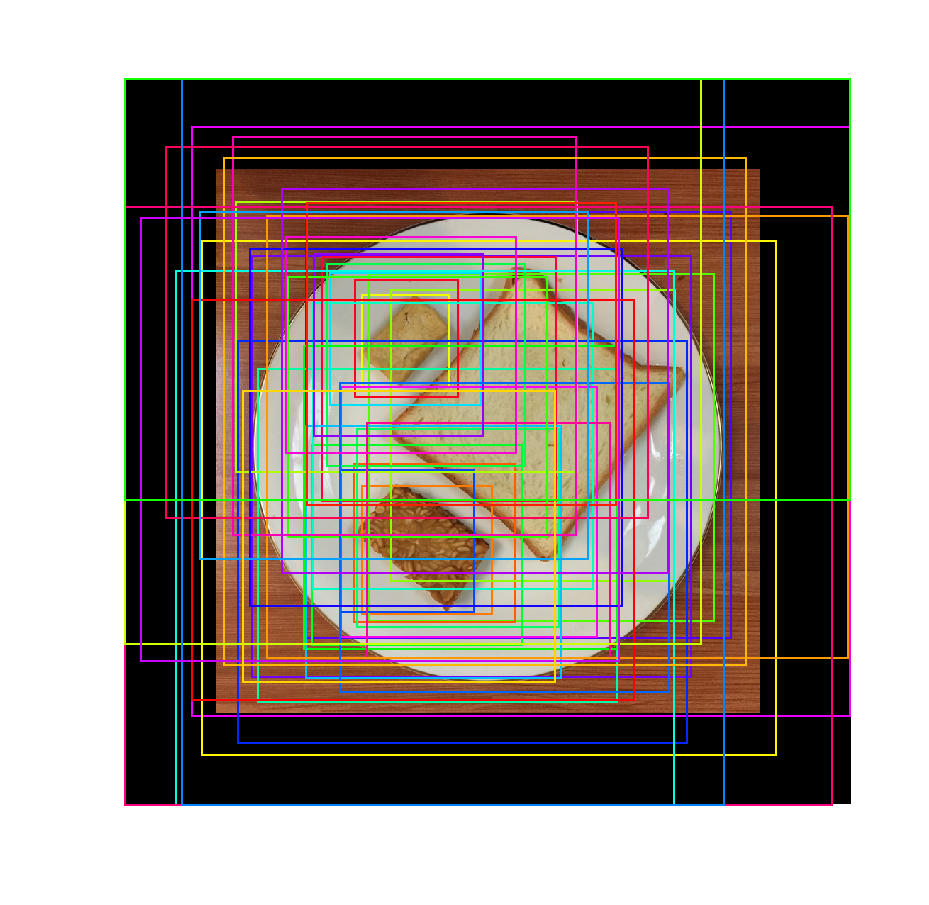

In [0]:
# Show final proposals
# These are the same as the previous step (refined anchors 
# after NMS) but with coordinates normalized to [0, 1] range.
limit = 50
# Convert back to image coordinates for display
h, w = config.IMAGE_SHAPE[:2]
proposals = rpn['proposals'][0, :limit] * np.array([h, w, h, w])
visualize.draw_boxes(image, refined_boxes=proposals, ax=get_ax())

In [0]:
# Measure the RPN recall (percent of objects covered by anchors)
# Here we measure recall for 3 different methods:
# - All anchors
# - All refined anchors
# - Refined anchors after NMS
iou_threshold = 0.50

recall, positive_anchor_ids = utils.compute_recall(model.anchors, gt_bbox, iou_threshold)
print("All Anchors ({:5})       Recall: {:.3f}  Positive anchors: {}".format(
    model.anchors.shape[0], recall, len(positive_anchor_ids)))

recall, positive_anchor_ids = utils.compute_recall(rpn['refined_anchors'][0], gt_bbox, iou_threshold)
print("Refined Anchors ({:5})   Recall: {:.3f}  Positive anchors: {}".format(
    rpn['refined_anchors'].shape[1], recall, len(positive_anchor_ids)))

recall, positive_anchor_ids = utils.compute_recall(proposals, gt_bbox, iou_threshold)
print("Post NMS Anchors ({:5})  Recall: {:.3f}  Positive anchors: {}".format(
    proposals.shape[0], recall, len(positive_anchor_ids)))


All Anchors (261888)       Recall: 1.000  Positive anchors: 96
Refined Anchors ( 6000)   Recall: 0.000  Positive anchors: 0
Post NMS Anchors (   50)  Recall: 1.000  Positive anchors: 22


## Stage 2: Proposal Classification

This stage takes the region proposals from the RPN and classifies them.

### 2.a Proposal Classification

Run the classifier heads on proposals to generate class propbabilities and bounding box regressions.

In [0]:
# Get input and output to classifier and mask heads.
mrcnn = model.run_graph([image], [
    ("proposals", model.keras_model.get_layer("ROI").output),
    ("probs", model.keras_model.get_layer("mrcnn_class").output),
    ("deltas", model.keras_model.get_layer("mrcnn_bbox").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
])

proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32
probs                    shape: (1, 1000, 7)          min:    0.00000  max:    1.00000  float32
deltas                   shape: (1, 1000, 7, 4)       min:   -4.26310  max:    3.01909  float32
masks                    shape: (1, 100, 28, 28, 7)   min:    0.00000  max:    1.00000  float32
detections               shape: (1, 100, 6)           min:    0.00000  max:    6.00000  float32


4 detections: ['piring' 'roti tawar' 'tahu goreng' 'tempe goreng']


/usr/local/lib/python3.6/dist-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


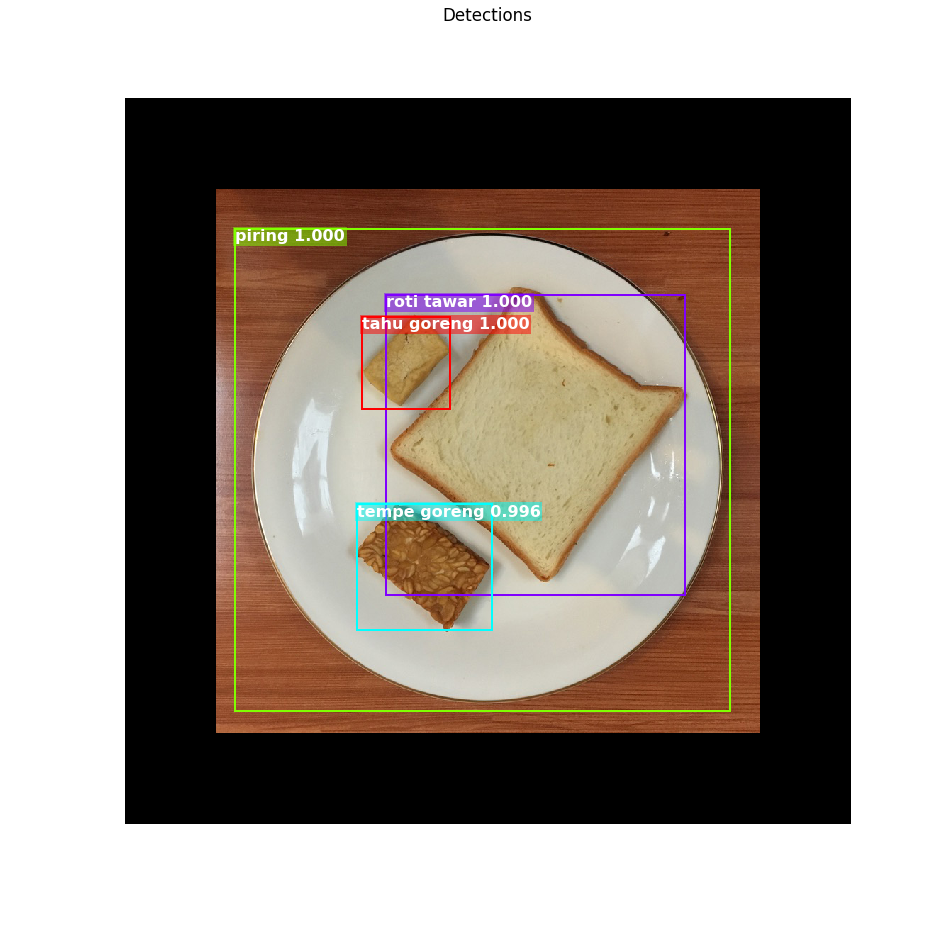

In [0]:
# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]
detections = mrcnn['detections'][0, :det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

captions = ["{} {:.3f}".format(dataset.class_names[int(c)], s) if c > 0 else ""
            for c, s in zip(detections[:, 4], detections[:, 5])]
visualize.draw_boxes(
    image, 
    refined_boxes=utils.denorm_boxes(detections[:, :4], image.shape[:2]),
    visibilities=[2] * len(detections),
    captions=captions, title="Detections",
    ax=get_ax())

### 2.c Step by Step Detection

Here we dive deeper into the process of processing the detections.

In [0]:
# Proposals are in normalized coordinates. Scale them
# to image coordinates.
h, w = config.IMAGE_SHAPE[:2]
proposals = np.around(mrcnn["proposals"][0] * np.array([h, w, h, w])).astype(np.int32)

# Class ID, score, and mask per proposal
roi_class_ids = np.argmax(mrcnn["probs"][0], axis=1)
roi_scores = mrcnn["probs"][0, np.arange(roi_class_ids.shape[0]), roi_class_ids]
roi_class_names = np.array(dataset.class_names)[roi_class_ids]
roi_positive_ixs = np.where(roi_class_ids > 0)[0]

# How many ROIs vs empty rows?
print("{} Valid proposals out of {}".format(np.sum(np.any(proposals, axis=1)), proposals.shape[0]))
print("{} Positive ROIs".format(len(roi_positive_ixs)))

# Class counts
print(list(zip(*np.unique(roi_class_names, return_counts=True))))

44 Valid proposals out of 1000
24 Positive ROIs
[('BG', 976), ('piring', 17), ('roti tawar', 2), ('tahu goreng', 2), ('tempe goreng', 3)]


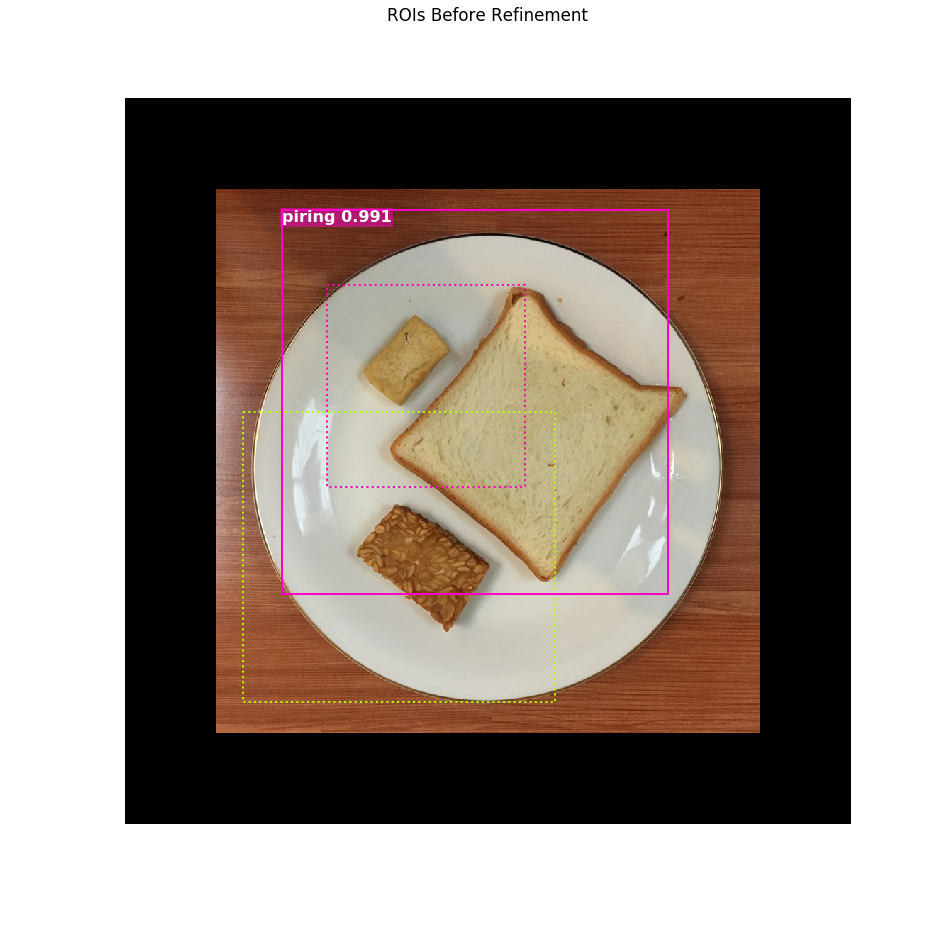

In [0]:
# Display a random sample of proposals.
# Proposals classified as background are dotted, and
# the rest show their class and confidence score.
limit = 200
ixs = np.random.randint(0, proposals.shape[0], limit)
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[ixs], roi_scores[ixs])]
visualize.draw_boxes(image, boxes=proposals[ixs],
                     visibilities=np.where(roi_class_ids[ixs] > 0, 2, 1),
                     captions=captions, title="ROIs Before Refinement",
                     ax=get_ax())

#### Apply Bounding Box Refinement

roi_bbox_specific        shape: (1000, 4)             min:   -3.05895  max:    2.25793  float32
refined_proposals        shape: (1000, 4)             min: -303.00000  max:  914.00000  int32


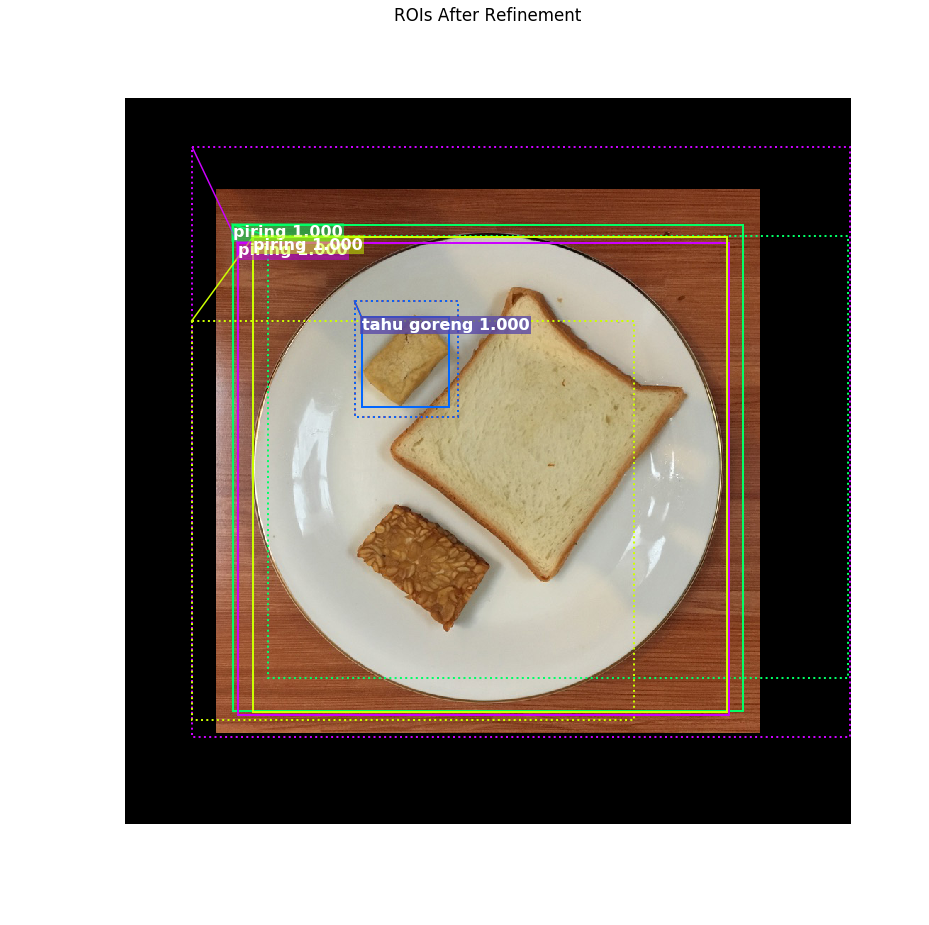

In [0]:
# Class-specific bounding box shifts.
roi_bbox_specific = mrcnn["deltas"][0, np.arange(proposals.shape[0]), roi_class_ids]
log("roi_bbox_specific", roi_bbox_specific)

# Apply bounding box transformations
# Shape: [N, (y1, x1, y2, x2)]
refined_proposals = utils.apply_box_deltas(
    proposals, roi_bbox_specific * config.BBOX_STD_DEV).astype(np.int32)
log("refined_proposals", refined_proposals)

# Show positive proposals
# ids = np.arange(roi_boxes.shape[0])  # Display all
limit = 5
ids = np.random.randint(0, len(roi_positive_ixs), limit)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[roi_positive_ixs][ids], roi_scores[roi_positive_ixs][ids])]
visualize.draw_boxes(image, boxes=proposals[roi_positive_ixs][ids],
                     refined_boxes=refined_proposals[roi_positive_ixs][ids],
                     visibilities=np.where(roi_class_ids[roi_positive_ixs][ids] > 0, 1, 0),
                     captions=captions, title="ROIs After Refinement",
                     ax=get_ax())

#### Filter Low Confidence Detections

In [0]:
# Remove boxes classified as background
keep = np.where(roi_class_ids > 0)[0]
#print(keep[17])
print("Keep {} detections:\n{}".format(keep.shape[0], keep))

Keep 24 detections:
[ 0  1  2  3  4  5  6  7  9 11 16 17 24 25 27 30 32 33 34 36 38 39 40 41]


In [0]:
# Remove low confidence detections
keep = np.intersect1d(keep, np.where(roi_scores >= config.DETECTION_MIN_CONFIDENCE)[0])
print("Remove boxes below {} confidence. Keep {}:\n{}".format(
    config.DETECTION_MIN_CONFIDENCE, keep.shape[0], keep))

Remove boxes below 0.9 confidence. Keep 22:
[ 0  1  2  3  4  5  6  9 11 16 17 24 25 27 30 32 33 34 36 38 39 41]


#### Per-Class Non-Max Suppression

In [0]:
# Apply per-class non-max suppression
pre_nms_boxes = refined_proposals[keep]
pre_nms_scores = roi_scores[keep]
pre_nms_class_ids = roi_class_ids[keep]

nms_keep = []
for class_id in np.unique(pre_nms_class_ids):
    # Pick detections of this class
    ixs = np.where(pre_nms_class_ids == class_id)[0]
    # Apply NMS
    class_keep = utils.non_max_suppression(pre_nms_boxes[ixs], 
                                            pre_nms_scores[ixs],
                                            config.DETECTION_NMS_THRESHOLD)
    
    print(class_keep)
    
    # Map indicies
    class_keep = keep[ixs[class_keep]]
    nms_keep = np.union1d(nms_keep, class_keep)
    print("{:22}: {} -> {}".format(dataset.class_names[class_id][:20], 
                                   keep[ixs], class_keep))

keep = np.intersect1d(keep, nms_keep).astype(np.int32)
print("\nKept after per-class NMS: {}\n{}".format(keep.shape[0], keep))

[7]
piring                : [ 4  6 11 17 24 25 27 30 32 33 34 36 38 39 41] -> [30]
[0]
tahu goreng           : [0 9] -> [0]
[2]
tempe goreng          : [ 1  3 16] -> [16]
[1]
roti tawar            : [2 5] -> [5]

Kept after per-class NMS: 4
[ 0  5 16 30]


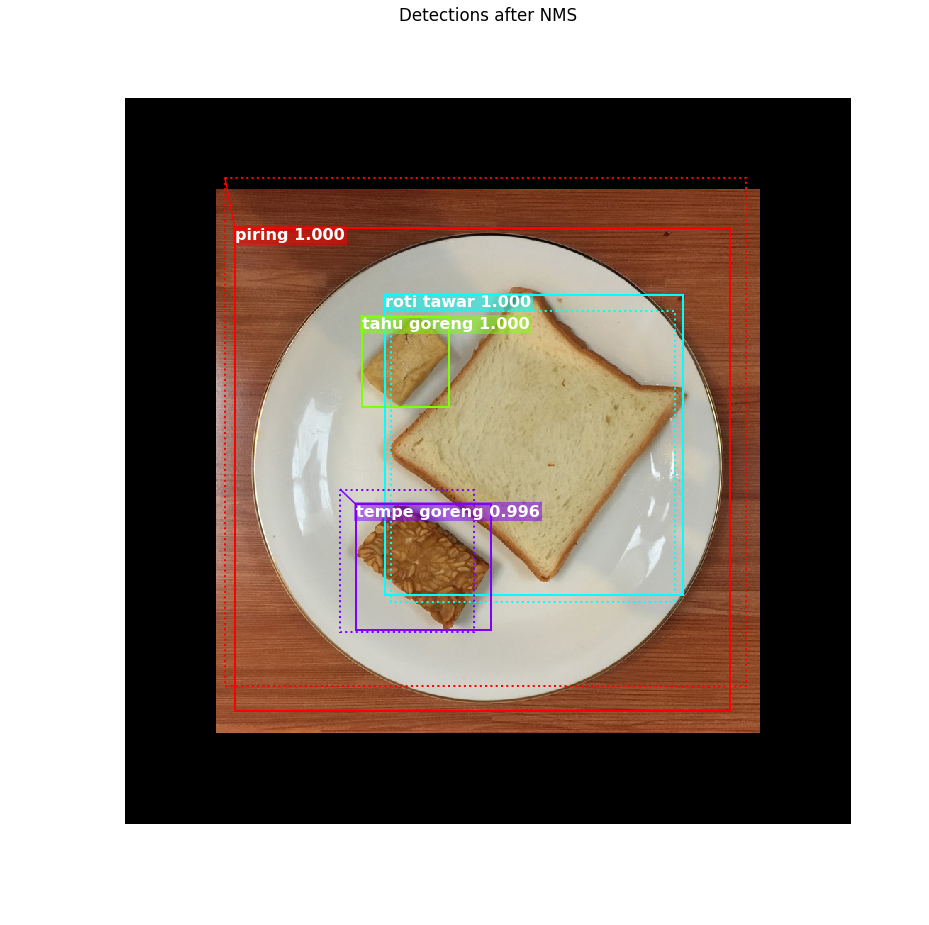

In [0]:
# Show final detections
ixs = np.arange(len(keep))  # Display all
# ixs = np.random.randint(0, len(keep), 10)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[keep][ixs], roi_scores[keep][ixs])]
visualize.draw_boxes(
    image, boxes=proposals[keep][ixs],
    refined_boxes=refined_proposals[keep][ixs],
    visibilities=np.where(roi_class_ids[keep][ixs] > 0, 1, 0),
    captions=captions, title="Detections after NMS",
    ax=get_ax())

## Stage 3: Generating Masks

This stage takes the detections (refined bounding boxes and class IDs) from the previous layer and runs the mask head to generate segmentation masks for every instance.

### 3.a Mask Targets

These are the training targets for the mask branch

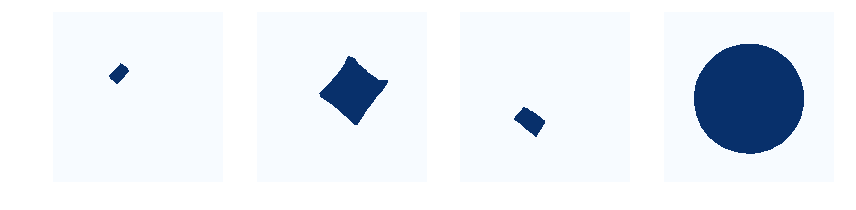

In [0]:
display_images(np.transpose(gt_mask, [2, 0, 1]), cmap="Blues")

### 3.b Predicted Masks

In [0]:
# Get predictions of mask head
mrcnn = model.run_graph([image], [
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
])

# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

detections               shape: (1, 100, 6)           min:    0.00000  max:    6.00000  float32
masks                    shape: (1, 100, 28, 28, 7)   min:    0.00000  max:    1.00000  float32
4 detections: ['piring' 'roti tawar' 'tahu goreng' 'tempe goreng']


In [0]:
# Masks
det_boxes = utils.denorm_boxes(mrcnn["detections"][0, :, :4], image.shape[:2])
det_mask_specific = np.array([mrcnn["masks"][0, i, :, :, c] 
                              for i, c in enumerate(det_class_ids)])
det_masks = np.array([utils.unmold_mask(m, det_boxes[i], image.shape)
                      for i, m in enumerate(det_mask_specific)])
log("det_mask_specific", det_mask_specific)
log("det_masks", det_masks)

det_mask_specific        shape: (4, 28, 28)           min:    0.00000  max:    1.00000  float32
det_masks                shape: (4, 1024, 1024)       min:    0.00000  max:    1.00000  bool


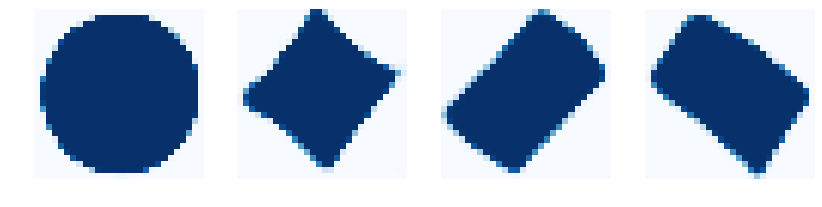

In [0]:
display_images(det_mask_specific[:7] * 255, cmap="Blues", interpolation="none")

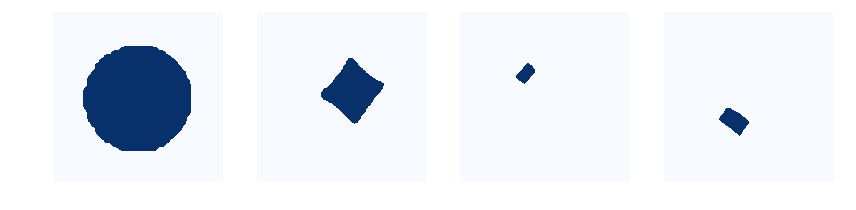

In [0]:
display_images(det_masks[:7] * 255, cmap="Blues", interpolation="none")

## Visualize Activations

In some cases it helps to look at the output from different layers and visualize them to catch issues and odd patterns.

In [0]:
# Get activations of a few sample layers
activations = model.run_graph([image], [
    ("input_image",        tf.identity(model.keras_model.get_layer("input_image").output)),
    ("res2c_out",          model.keras_model.get_layer("res2c_out").output),
    ("res3c_out",          model.keras_model.get_layer("res3c_out").output),
    ("res4w_out",          model.keras_model.get_layer("res4w_out").output),  # for resnet100
    ("mrcnn_class_conv2",      model.keras_model.get_layer("mrcnn_class_conv2").output),
    ("rpn_bbox",           model.keras_model.get_layer("rpn_bbox").output),
    ("roi",                model.keras_model.get_layer("ROI").output),
])

input_image              shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10001  float32
res2c_out                shape: (1, 256, 256, 256)    min:    0.00000  max:   28.25948  float32
res3c_out                shape: (1, 128, 128, 512)    min:    0.00000  max:   30.04012  float32
res4w_out                shape: (1, 64, 64, 1024)     min:    0.00000  max:   76.01578  float32
mrcnn_class_conv2        shape: (1, 1000, 1, 1, 1024)  min:   -4.33461  max:    3.62534  float32
rpn_bbox                 shape: (1, 261888, 4)        min:   -5.48029  max:  165.20692  float32
roi                      shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32


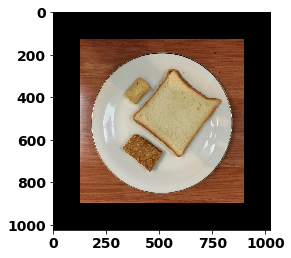

In [0]:
# Input image (normalized)
_ = plt.imshow(modellib.unmold_image(activations["input_image"][0],config))

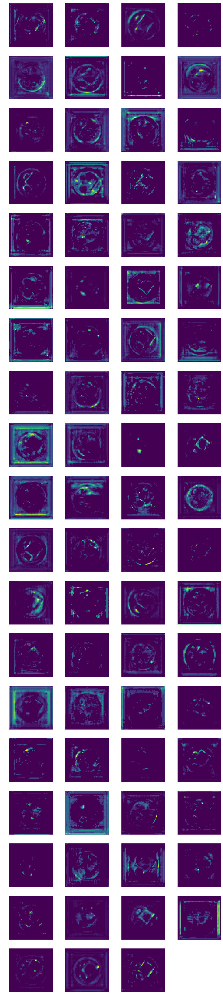

In [0]:
# Backbone feature map
display_images(np.transpose(activations["res4w_out"][0,:,:,:75], [2, 0, 1]))

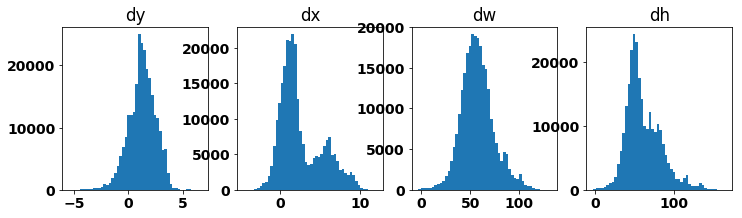

In [0]:
# Histograms of RPN bounding box deltas
plt.figure(figsize=(12, 3))
plt.subplot(1, 4, 1)
plt.title("dy")
_ = plt.hist(activations["rpn_bbox"][0,:,0], 50)
plt.subplot(1, 4, 2)
plt.title("dx")
_ = plt.hist(activations["rpn_bbox"][0,:,1], 50)
plt.subplot(1, 4, 3)
plt.title("dw")
_ = plt.hist(activations["rpn_bbox"][0,:,2], 50)
plt.subplot(1, 4, 4)
plt.title("dh")
_ = plt.hist(activations["rpn_bbox"][0,:,3], 50)

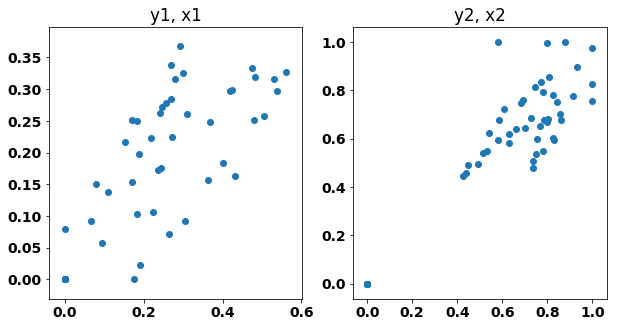

In [0]:
# Distribution of y, x coordinates of generated proposals
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("y1, x1")
plt.scatter(activations["roi"][0,:,0], activations["roi"][0,:,1])
plt.subplot(1, 2, 2)
plt.title("y2, x2")
plt.scatter(activations["roi"][0,:,2], activations["roi"][0,:,3])
plt.show()

/usr/local/lib/python3.6/dist-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


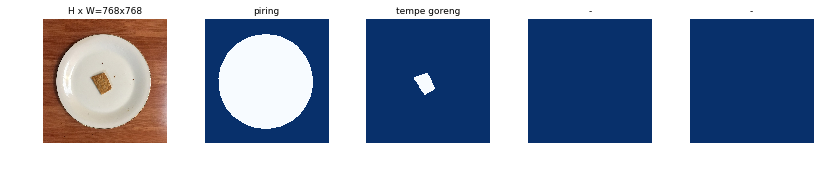

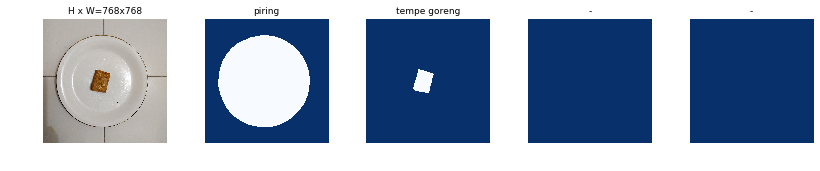

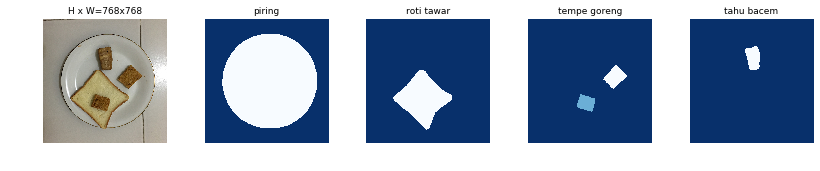

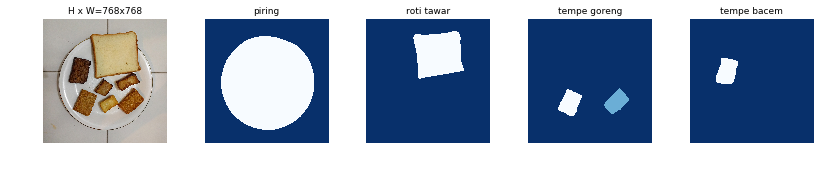

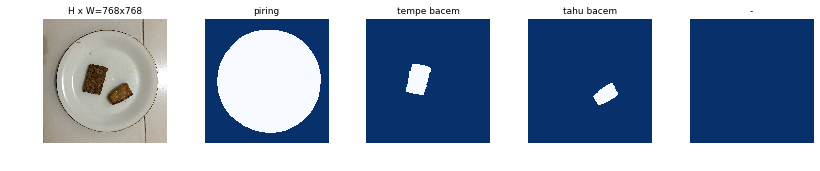

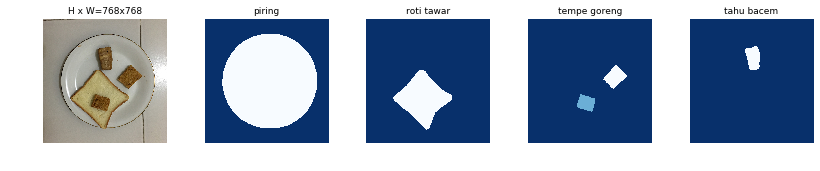

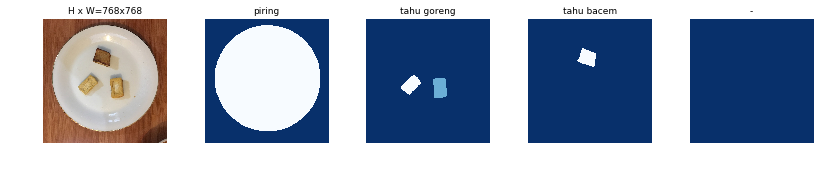

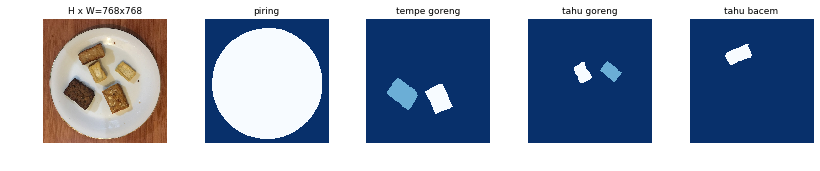

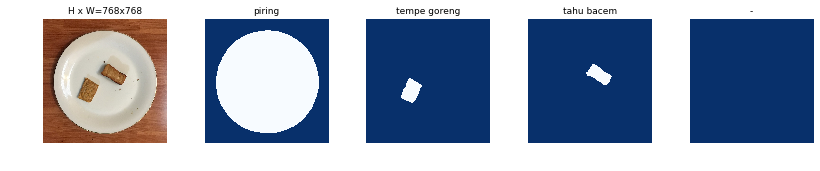

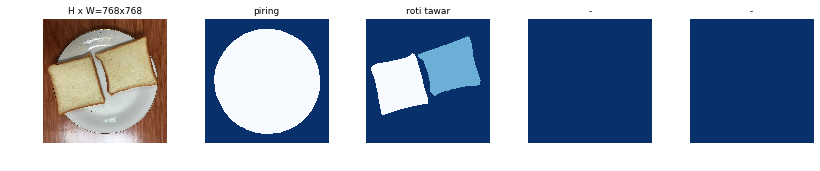

In [0]:
# Tampilkan random samples
image_ids = np.random.choice(dataset.image_ids, 10)
for image_id in image_ids:
    image = dataset.load_image(image_id)
    mask, class_ids = dataset.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset.class_names)

image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
image_meta               shape: (19,)                 min:    1.00000  max: 1024.00000  int64
class_ids                shape: (4,)                  min:    1.00000  max:    6.00000  int64
bbox                     shape: (4, 4)                min:  179.00000  max:  855.00000  int32
mask                     shape: (1024, 1024, 4)       min:    0.00000  max:    1.00000  bool


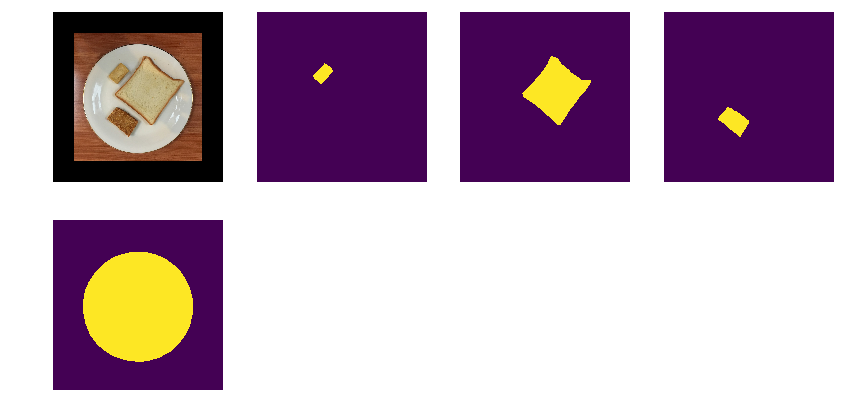

In [0]:
#image_id = np.random.choice(dataset.image_ids, 1)[0]

image_id = dataset.image_ids[6]
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset, config, image_id, use_mini_mask=False)

log("image", image)
log("image_meta", image_meta)
log("class_ids", class_ids)
log("bbox", bbox)
log("mask", mask)

display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

mask                     shape: (56, 56, 4)           min:    0.00000  max:    1.00000  bool


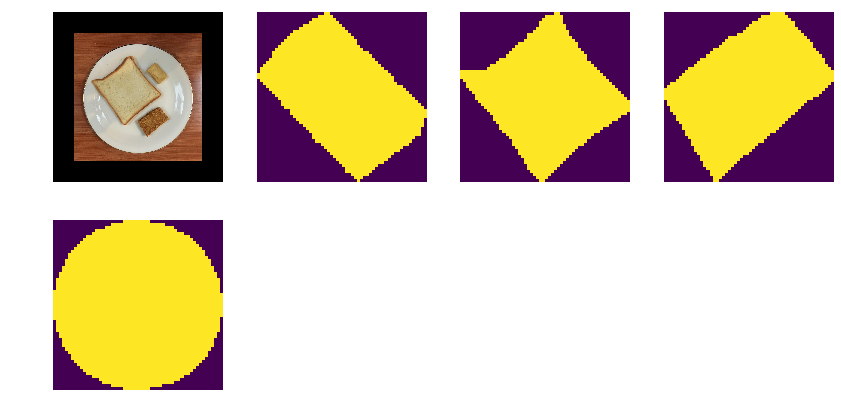

In [0]:
# Add augmentation and mask resizing.
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset, config, image_id, augment=True, use_mini_mask=True)
log("mask", mask)
display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

In [0]:
# Generate Anchors
backbone_shapes = modellib.compute_backbone_shapes(config, config.IMAGE_SHAPE)
anchors = utils.generate_pyramid_anchors(config.RPN_ANCHOR_SCALES, 
                                          config.RPN_ANCHOR_RATIOS,
                                          backbone_shapes,
                                          config.BACKBONE_STRIDES, 
                                          config.RPN_ANCHOR_STRIDE)

# Print summary of anchors
num_levels = len(backbone_shapes)
anchors_per_cell = len(config.RPN_ANCHOR_RATIOS)
print("Count: ", anchors.shape[0])
print("Scales: ", config.RPN_ANCHOR_SCALES)
print("ratios: ", config.RPN_ANCHOR_RATIOS)
print("Anchors per Cell: ", anchors_per_cell)
print("Levels: ", num_levels)
anchors_per_level = []
for l in range(num_levels):
    num_cells = backbone_shapes[l][0] * backbone_shapes[l][1]
    anchors_per_level.append(anchors_per_cell * num_cells // config.RPN_ANCHOR_STRIDE**2)
    print("Anchors in Level {}: {}".format(l, anchors_per_level[l]))

Count:  261888
Scales:  (32, 64, 128, 256, 512)
ratios:  [0.5, 1, 2]
Anchors per Cell:  3
Levels:  5
Anchors in Level 0: 196608
Anchors in Level 1: 49152
Anchors in Level 2: 12288
Anchors in Level 3: 3072
Anchors in Level 4: 768


Level 0. Anchors: 196608  Feature map Shape: [256 256]
Level 1. Anchors:  49152  Feature map Shape: [128 128]
Level 2. Anchors:  12288  Feature map Shape: [64 64]
Level 3. Anchors:   3072  Feature map Shape: [32 32]
Level 4. Anchors:    768  Feature map Shape: [16 16]


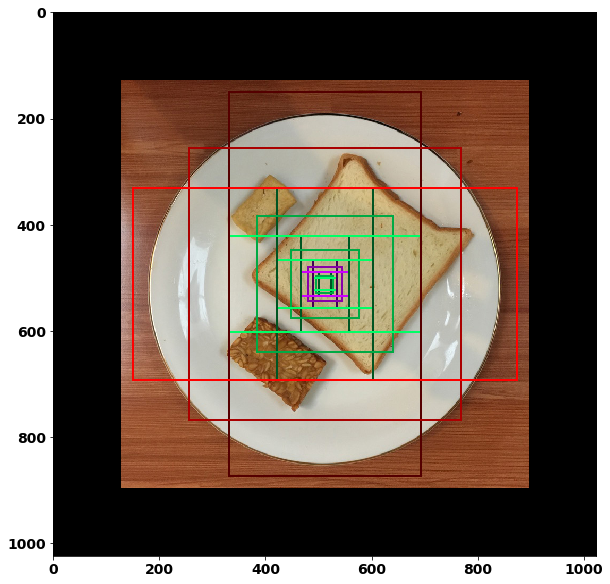

In [0]:
## Visualize anchors of one cell at the center of the feature map of a specific level

# Load and draw random image
#image_id = np.random.choice(dataset.image_ids, 1)[0]

image_id = dataset.image_ids[6]
image, image_meta, _, _, _ = modellib.load_image_gt(dataset, config, image_id)
fig, ax = plt.subplots(1, figsize=(10, 10))
ax.imshow(image)
levels = len(backbone_shapes)

for level in range(levels):
    colors = visualize.random_colors(levels)
    # Compute the index of the anchors at the center of the image
    level_start = sum(anchors_per_level[:level]) # sum of anchors of previous levels
    level_anchors = anchors[level_start:level_start+anchors_per_level[level]]
    print("Level {}. Anchors: {:6}  Feature map Shape: {}".format(level, level_anchors.shape[0], 
                                                                  backbone_shapes[level]))
    center_cell = backbone_shapes[level] // 2
    center_cell_index = (center_cell[0] * backbone_shapes[level][1] + center_cell[1])
    level_center = center_cell_index * anchors_per_cell 
    center_anchor = anchors_per_cell * (
        (center_cell[0] * backbone_shapes[level][1] / config.RPN_ANCHOR_STRIDE**2) \
        + center_cell[1] / config.RPN_ANCHOR_STRIDE)
    level_center = int(center_anchor)

    # Draw anchors. Brightness show the order in the array, dark to bright.
    for i, rect in enumerate(level_anchors[level_center:level_center+anchors_per_cell]):
        y1, x1, y2, x2 = rect
        p = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, facecolor='none',
                              edgecolor=(i+1)*np.array(colors[level]) / anchors_per_cell)
        ax.add_patch(p)

In [0]:
!pwd

import os
os.chdir('/content/drive/My Drive/My Research/T h e s i s')

!pwd

/content/drive/My Drive/My Research/T h e s i s
/content/drive/My Drive/My Research/T h e s i s


In [0]:
img_list = ['iphone_00124.jpg','iphone_00126.jpg','iphone_00138.jpg']
import matplotlib.image as mpimg


for img in img_list:

    
    image = mpimg.imread('/content/drive/My Drive/My Research/T h e s i s/dataset/test/'+str(img))
    # Run object detection
    print(len([image]))
    results = model.detect([image], verbose=1)

    # Display results
    ax = get_ax(1)
    r = results[0]
    '''
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], dataset.class_names,
                      scores=r['scores'], title="Test",
                      figsize=(16, 16), ax=ax,
                      show_mask=True, show_bbox=True,
                      colors=None, captions=None) 
    
    
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                                dataset.class_names, r['scores'], ax=ax,
                                title="Test")
    '''
    #visualize.display_weight_stats(model)
    
    '''
                   
                      
    visualize.display_differences(image,
                        gt_box, gt_class_id, gt_mask,
                        pred_box, pred_class_id, pred_score, pred_mask,
                        class_names, title="", ax=None,
                        show_mask=True, show_box=True,
                        iou_threshold=0.5, score_threshold=0.5)
  
    
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                                dataset.class_names, r['scores'], ax=ax,
                                title="Test")
    
    display_differences(image,
                        r['rois'], r['class_ids'], r['masks'],
                        pred_box, pred_class_id, pred_score, pred_mask,
                        class_names, title="", ax=None,
                        show_mask=True, show_box=True,
                        iou_threshold=0.5, score_threshold=0.5)
    '''
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], dataset.class_names,
                      scores=r['scores'], title="Test",
                      figsize=(16, 16), ax=ax,
                      show_mask=True, show_bbox=False,
                      colors=None, captions=None) 

Output hidden; open in https://colab.research.google.com to view.

image ID: makanan.iphone_00085.jpg (27) /content/drive/My Drive/My Research/T h e s i s/dataset/val/iphone_00085.jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 19)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
gt_class_id              shape: (3,)                  min:    1.00000  max:    6.00000  int64
gt_bbox                  shape: (3, 4)                min:  219.00000  max:  817.00000  int32
gt_mask                  shape: (1024, 1024, 3)       min:    0.00000  max:    1.00000  bool


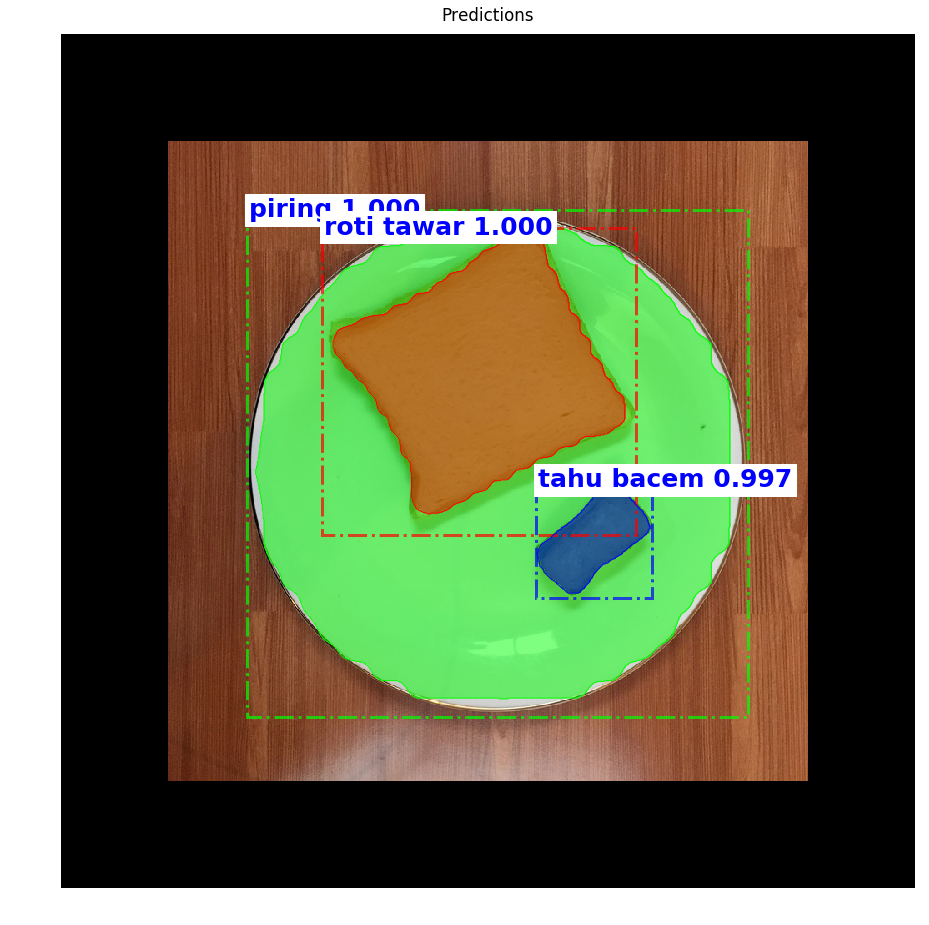

In [0]:
image_id = random.choice(dataset.image_ids)
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
info = dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))
# Run object detection
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset.class_names, r['scores'], ax=ax,
                            title="Predictions")
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 19)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


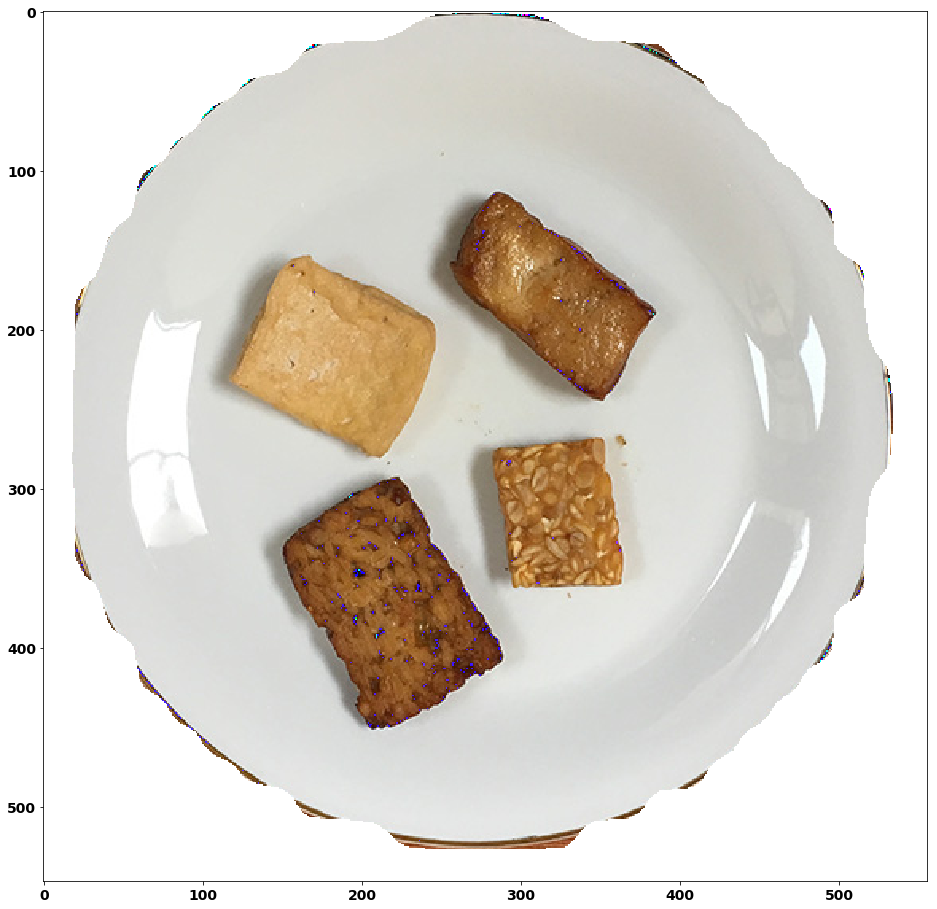

Kelas Obyek:  piring
Luas (px2): 211247


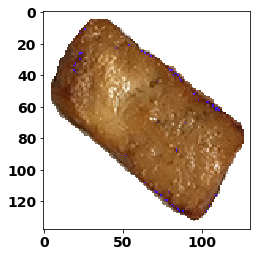

Kelas Obyek:  tahu bacem
Luas (px2): 8495
Luas (cm2): 21
Tinggi (cm):  1.5
Volume (cm3): 31
Massa Jenis (g/cm3): 1.07176564
Massa (g): 33
Kalori (kal): 49


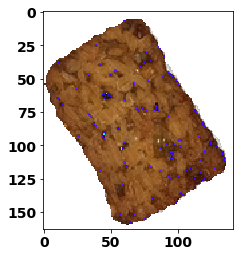

Kelas Obyek:  tempe bacem
Luas (px2): 12198
Luas (cm2): 29
Tinggi (cm):  1.3
Volume (cm3): 38
Massa Jenis (g/cm3): 0.96562894
Massa (g): 36
Kalori (kal): 114


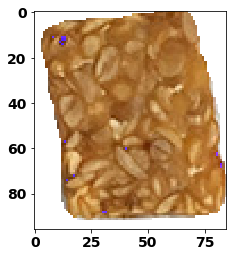

Kelas Obyek:  tempe goreng
Luas (px2): 6284
Luas (cm2): 15
Tinggi (cm):  1
Volume (cm3): 15
Massa Jenis (g/cm3): 0.92200312
Massa (g): 13
Kalori (kal): 31


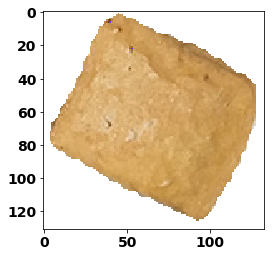

Kelas Obyek:  tahu goreng
Luas (px2): 9877
Luas (cm2): 24
Tinggi (cm):  1.4
Volume (cm3): 33
Massa Jenis (g/cm3): 0.71828812
Massa (g): 25
Kalori (kal): 27


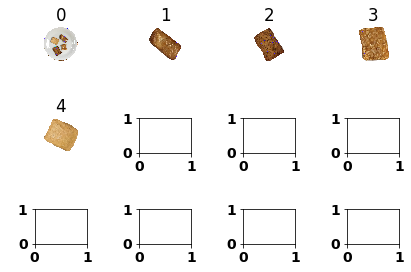

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 19)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


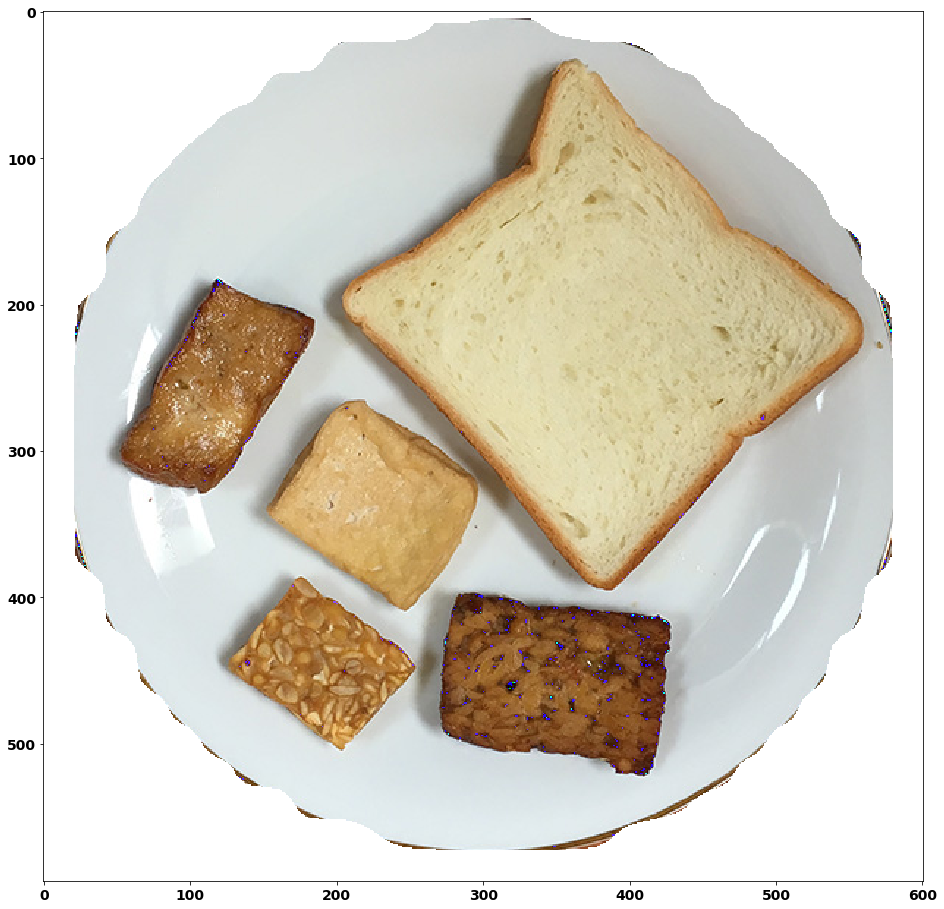

Kelas Obyek:  piring
Luas (px2): 252179


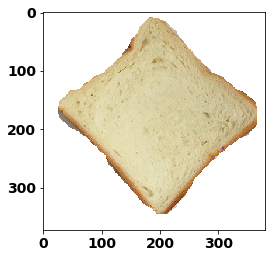

Kelas Obyek:  roti tawar
Luas (px2): 60814
Luas (cm2): 123
Tinggi (cm):  1.3
Volume (cm3): 160
Massa Jenis (g/cm3): 0.23746279
Massa (g): 38
Kalori (kal): 97


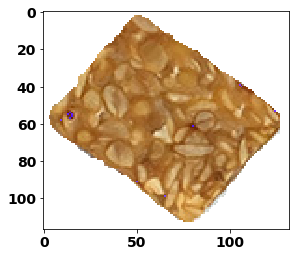

Kelas Obyek:  tempe goreng
Luas (px2): 7645
Luas (cm2): 15
Tinggi (cm):  1
Volume (cm3): 15
Massa Jenis (g/cm3): 0.90471012
Massa (g): 13
Kalori (kal): 32


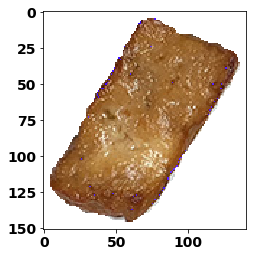

Kelas Obyek:  tahu bacem
Luas (px2): 10238
Luas (cm2): 21
Tinggi (cm):  1.5
Volume (cm3): 31
Massa Jenis (g/cm3): 1.06161356
Massa (g): 33
Kalori (kal): 49


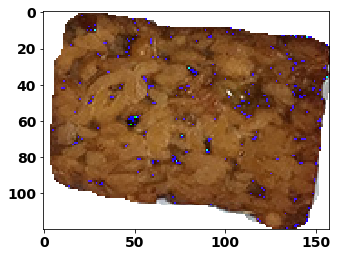

Kelas Obyek:  tempe bacem
Luas (px2): 14819
Luas (cm2): 30
Tinggi (cm):  1.3
Volume (cm3): 39
Massa Jenis (g/cm3): 0.94885177
Massa (g): 37
Kalori (kal): 116


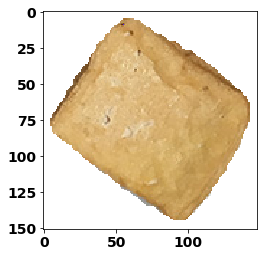

Kelas Obyek:  tahu goreng
Luas (px2): 11893
Luas (cm2): 24
Tinggi (cm):  1.4
Volume (cm3): 34
Massa Jenis (g/cm3): 0.71211591
Massa (g): 25
Kalori (kal): 27


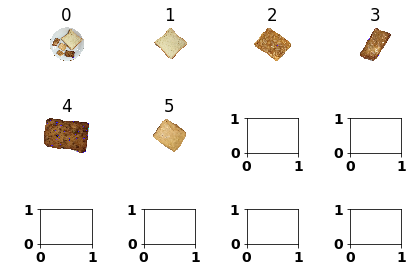

Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 19)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


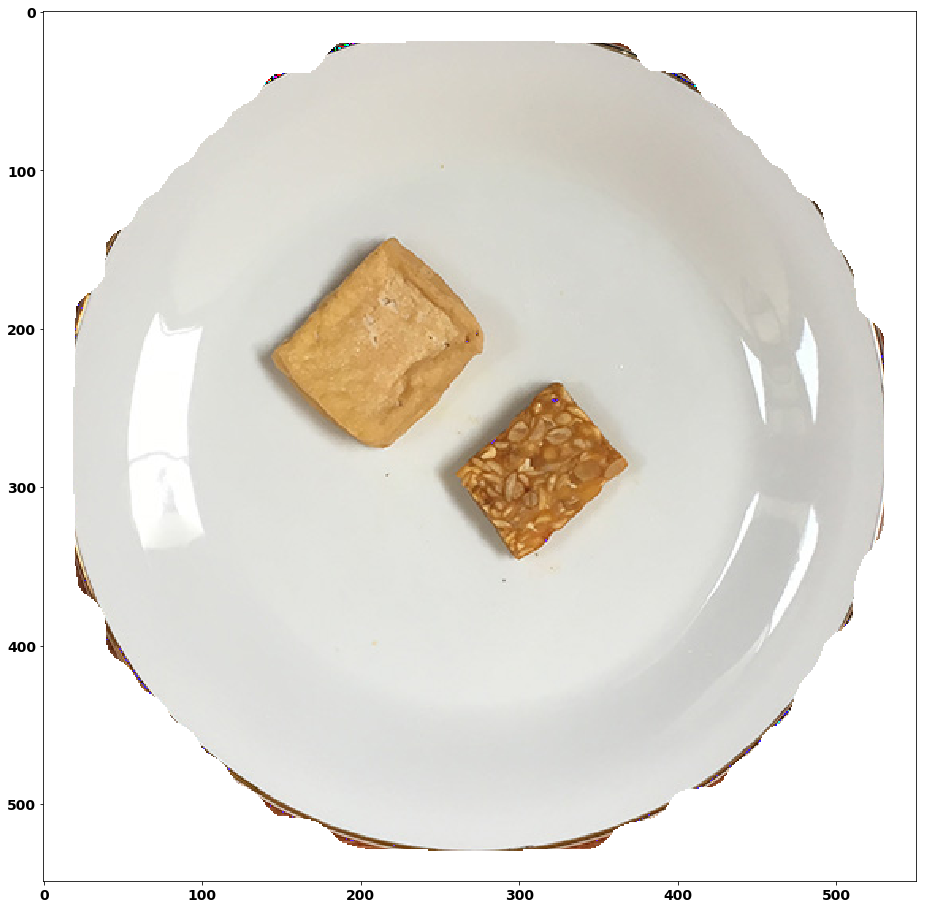

Kelas Obyek:  piring
Luas (px2): 211777


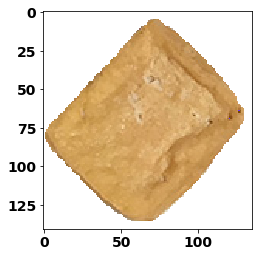

Kelas Obyek:  tahu goreng
Luas (px2): 9977
Luas (cm2): 24
Tinggi (cm):  1.4
Volume (cm3): 34
Massa Jenis (g/cm3): 0.71287274
Massa (g): 25
Kalori (kal): 27


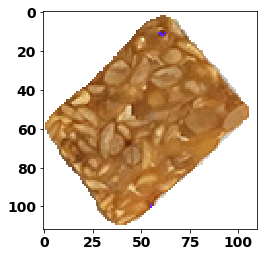

Kelas Obyek:  tempe goreng
Luas (px2): 6316
Luas (cm2): 15
Tinggi (cm):  1
Volume (cm3): 15
Massa Jenis (g/cm3): 0.91963330
Massa (g): 13
Kalori (kal): 31


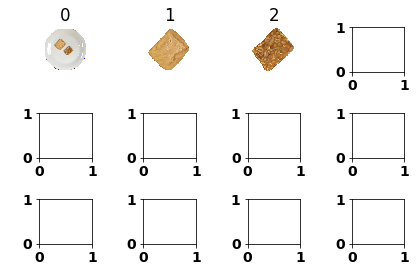

In [0]:
img_list = ['measured_final_00008.jpg', 'measured_final_00010.jpg', 'measured_final_00006.jpg'] # piring.jpg, '27.jpg', '41.jpg'
import matplotlib.image as mpimg
import cv2

import matplotlib.pyplot as plt
import numpy as np

rPiringRiil = float(25.5)/2;  # cm
lPiringRiil = float(3.14) * (rPiringRiil ** 2)  # cm2
lPiringCitra = 0
lObjectCitra = 0
lObjectRiil = 0
pxToCm = 0.0264583333
gToKg = 0.001
gravity = float(9.8)

"""
Nama Makanan	Berat (g)	Kalori	Unit
Tahu Goreng	    100	        111	    1,5
Tempe Goreng	50	        118	    1,5
Tahu Bacem	    100	        147	    1,75
Tempe Bacem	    50	        157	    2
Roti Tawar	    50	        128	    1,5
"""

kaloriPerGramTahuGoreng = 111 / 100
kaloriPerGramTempeGoreng = 118 / 50
kaloriPerGramTahuBacem = 147 / 100
kaloriPerGramTempeBacem = 157 / 50
kaloriPerGramRotiTawar = 128 / 50

dictTinggi = {'tahu bacem': 1.5, 'tempe bacem': 1.3, 'tahu goreng': 1.4, 'tempe goreng': 1, 'roti tawar': 1.3} # Dalam cm
dictMassaJenis = {'tahu bacem': 1.07637767, 'tempe bacem': 0.94677915, 'tahu goreng': 0.73509084, 'tempe goreng': 0.87187761, 'roti tawar': 0.23700689}
dictMassa = {'tahu bacem': 33, 'tempe bacem': 37, 'tahu goreng': 24, 'tempe goreng': 14, 'roti tawar': 38}
dictkalori = {'tahu bacem': kaloriPerGramTahuBacem, 'tempe bacem': kaloriPerGramTempeBacem, 'tahu goreng': kaloriPerGramTahuGoreng, 'tempe goreng': kaloriPerGramTempeGoreng, 'roti tawar': kaloriPerGramRotiTawar}

def plot_figures(figures, nrows = 1, ncols=1):
    """Plot a dictionary of figures.

    Parameters
    ----------
    figures : <title, figure> dictionary
    ncols : number of columns of subplots wanted in the display
    nrows : number of rows of subplots wanted in the figure
    """

    fig, axeslist = plt.subplots(ncols=ncols, nrows=nrows)
    for ind,title in zip(range(len(figures)), figures):
        axeslist.ravel()[ind].imshow(figures[title], cmap=plt.jet())
        axeslist.ravel()[ind].set_title(title)
        axeslist.ravel()[ind].set_axis_off()
    plt.tight_layout() # optional


def make_segmentation_mask(image, mask,rois):
        img = image.copy()
        img[:,:,0] *= mask
        img[:,:,1] *= mask
        img[:,:,2] *= mask
        #start y end y start x end x [429 501 642 566]
        img[img[:,:,:]== 0] = 255
        cropped = img[rois[0]:rois[2],rois[1]:rois[3]]
        #mat_plot_lib_figure
        plt.imshow(cropped)
        plt.show()
        return  cropped
        
        
for img in img_list:

    image = mpimg.imread('/content/drive/My Drive/My Research/T h e s i s/dataset/test/'+str(img))
    # Run object detection
    #print(len([image]))
    results = model.detect([image], verbose=1)

    # Display results
    ax = get_ax(1)
    r = results[0]
    #image2 = image.copy()
    
    #print(image.shape,r['masks'].shape)
    #print(r['masks'].shape[-1])
    
    class_label = dataset.class_names;
    
    figures = {}
    for i in range(r['masks'].shape[-1]):
      
        class_id = r['class_ids'][i]
        mask = r['masks'][:,:,i]
        croped_roi_image = make_segmentation_mask(image, mask, r['rois'][i])
        luas = np.reshape(mask, (-1, mask.shape[-1])).astype(np.float32).sum()
        
        # print(class_label[class_id])
        
        print('Kelas Obyek: ', class_label[class_id])
        print('Luas (px2): %.0f' %  np.reshape(mask, (-1, mask.shape[-1])).astype(np.float32).sum()) 
        
        if (class_label[class_id] == 'piring'):
            lPiringCitra = luas * pxToCm
        else:           
            lObjectCitra = luas * pxToCm
            lObjectRiil = lObjectCitra * lPiringRiil / lPiringCitra
            vObjectRiil = lObjectRiil * dictTinggi.get(class_label[class_id], "")
            # mOjectRiil = vObjectRiil * dictMassaJenis.get(class_label[class_id], "")
            
            # Bisa disembunyikan atau ditampilkan, untuk inference disembunyikan, gunakan massa jenis konstanta
            massaJenis = dictMassa.get(class_label[class_id], "") / vObjectRiil
            massa = dictMassaJenis.get(class_label[class_id], "") * vObjectRiil
            
            #kaloriMakanan = dictMassaJenis.get(class_label[class_id], "") * massa
            kaloriMakanan = massa * dictkalori.get(class_label[class_id], "")
            
            print('Luas (cm2): %.0f' %  lObjectRiil)
            print('Tinggi (cm): ', dictTinggi.get(class_label[class_id], ""))
            print ('Volume (cm3): %.0f' %  vObjectRiil)
            print ('Massa Jenis (g/cm3): %.8f' %  massaJenis)
            print ('Massa (g): %.0f' %  massa)
            print ('Kalori (kal): %.0f' %  kaloriMakanan)
            
        figures[i] = croped_roi_image
        #print(len(figures))
                

    # plot of the images in a figure, with 5 rows and 4 columns
    plot_figures(figures, 3,4)
    plt.show()
    
    """
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                                dataset.class_names, r['scores'], ax=ax,
                                title="display_instances")
    """

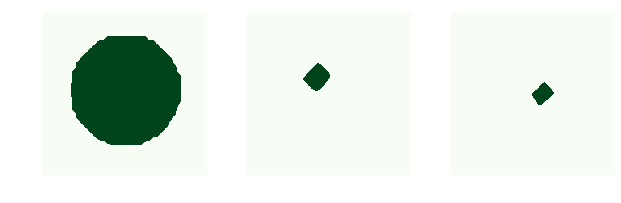

In [0]:
display_images(np.transpose(r['masks'], [2,0,1]), cmap="Greens")

In [0]:
print('Luas Seluruh Object:',  np.reshape(r['masks'], (-1, r['masks'].shape[-1])).astype(np.float32).sum())

Luas Seluruh Object: 228070.0


In [0]:

!ls ./dataset/test

In [0]:
import cv2
import numpy as np
import colorsys

DEVICE = "/gpu:0"

'''
def random_colors(N):
    np.random.seed(1)
    colors = [tuple(255 * np.random.rand(3)) for _ in range(N)]
    return colors
  
def apply_mask(image, mask, color, alpha=0.4):
    # apply mask to image
    for n, c in enumerate(color):
        image[:, :, n] = np.where(
            mask == 1,
            image[:, :, n] * (1 - alpha) + alpha * c,
            image[:, :, n]
        )
    return image
'''

def random_colors(N, bright=True):
    """
    Generate random colors.
    To get visually distinct colors, generate them in HSV space then
    convert to RGB.
    """
    brightness = 1.0 if bright else 0.7
    hsv = [(i / N, 1, brightness) for i in range(N)]
    colors = list(map(lambda c: colorsys.hsv_to_rgb(*c), hsv))
    random.shuffle(colors)
    return colors


def apply_mask(image, mask, color, alpha=0.4):
    """Apply the given mask to the image.
    """
    for c in range(3):
        image[:, :, c] = np.where(mask == 1,
                                  image[:, :, c] *
                                  (1 - alpha) + alpha * color[c] * 255,
                                  image[:, :, c])
    return image

def display_instances(image, boxes, masks, ids, names, scores):
    """
        take the image and results and apply the mask, box, and Label
    """
    
    rPiringRiil = float(25.5)/2;  # cm
    lPiringRiil = float(3.14) * (rPiringRiil ** 2)  # cm2
    pxToCm = 0.0264583333
    lPiringCitra = 0
    lObjectRiil = 0
    
    n_instances = boxes.shape[0]
    colors = random_colors(n_instances)

    if not n_instances:
        print('NO INSTANCES TO DISPLAY')
    else:
        assert boxes.shape[0] == masks.shape[-1] == ids.shape[0]

    for i, color in enumerate(colors):
        if not np.any(boxes[i]):
            continue

        y1, x1, y2, x2 = boxes[i]
        label = names[ids[i]]
        score = scores[i] if scores is not None else None
        # caption = '{} {:.2f}'.format(label, score) if score else label
        mask = masks[:, :, i]

        
        # Tambahanku untuk hitung luas
        lObjectCitra = np.reshape(mask, (-1, mask.shape[-1])).astype(np.float32).sum()
        caption = '{} Score: {:.2f} Area: {:.2f} cm2'.format(label, score, lObjectRiil) if score else label
        
        if (label == 'piring'):
            # print ('~' + label)
            lObjectRiil = lPiringRiil
            lPiringCitra = lObjectCitra * pxToCm
        else:
            # print ('~' + label)
            lObjectCitra = lObjectCitra * pxToCm
            lObjectRiil = lObjectCitra * lPiringRiil / lPiringCitra
            
            image = apply_mask(image, mask, color)
            image = cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
            image = cv2.putText(
                image, caption, (x1, y1), cv2.FONT_HERSHEY_COMPLEX, 0.8, color, 2
            )

    return image


if __name__ == '__main__':
    """
        test everything
    """
    import os
    import sys
    from mrcnn import utils
    #import coco
    #import utils
    from mrcnn.config import Config
    from mrcnn import model as modellib, utils
    
    # We use a K80 GPU with 24GB memory, which can fit 3 images.
    batch_size = 2

    ROOT_DIR = os.getcwd()
    MODEL_DIR = os.path.join(ROOT_DIR, "logs")
    VIDEO_DIR = os.path.join(ROOT_DIR, "dataset/test")
    VIDEO_SAVE_DIR = os.path.join(ROOT_DIR, "output/images")
    
    """
    COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
    if not os.path.exists(COCO_MODEL_PATH):
        utils.download_trained_weights(COCO_MODEL_PATH)

    class InferenceConfig(coco.CocoConfig):
        GPU_COUNT = 1
        IMAGES_PER_GPU = batch_size

    config = InferenceConfig()
    config.display()

    model = modellib.MaskRCNN(
        mode="inference", model_dir=MODEL_DIR, config=config
    )
    model.load_weights(COCO_MODEL_PATH, by_name=True)
    class_names = [
        'BG', 'person', 'bicycle', 'car', 'motorcycle', 'airplane',
        'bus', 'train', 'truck', 'boat', 'traffic light',
        'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird',
        'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear',
        'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie',
        'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
        'kite', 'baseball bat', 'baseball glove', 'skateboard',
        'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup',
        'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
        'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
        'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed',
        'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
        'keyboard', 'cell phone', 'microwave', 'oven', 'toaster',
        'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors',
        'teddy bear', 'hair drier', 'toothbrush'
    ]
    """
    
    MAKANAN_WEIGHT_PATH = os.path.join(ROOT_DIR, "logs/makanan20190217T2239/mask_rcnn_makanan_0040.h5") 
    class InferenceConfig(config.__class__):
        GPU_COUNT = 1
        IMAGES_PER_GPU = batch_size
    
    config = custom.CustomConfig()
    # config = InferenceConfig()
    config.display()

    # Create model in inference mode
    with tf.device(DEVICE):
        model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR, config=config)
    
    model.load_weights(MAKANAN_WEIGHT_PATH, by_name=True)
    class_names = [
        'BG', 'piring', 'tahu bacem', 'tahu goreng', 'tempe bacem', 'tempe goreng', 'roti tawar'  
    ]   
        
    capture = cv2.VideoCapture(os.path.join(VIDEO_DIR, 'inference_video_cut.mp4'))
    try:
        if not os.path.exists(VIDEO_SAVE_DIR):
            os.makedirs(VIDEO_SAVE_DIR)
    except OSError:
        print ('Error: Creating directory of data')
    frames = []
    frame_count = 0
    # these 2 lines can be removed if you dont have a 1080p camera.
    capture.set(cv2.CAP_PROP_FRAME_WIDTH, 1920)
    capture.set(cv2.CAP_PROP_FRAME_HEIGHT, 1080)

    while True:
        ret, frame = capture.read()
        # Bail out when the video file ends
        if not ret:
            break
        
        # Save each frame of the video to a list
        frame_count += 1
        frames.append(frame)
        print('frame_count :{0}'.format(frame_count))
        if len(frames) == batch_size:
            results = model.detect(frames, verbose=0)
            print('Predicted')
            for i, item in enumerate(zip(frames, results)):
                frame = item[0]
                r = item[1]
                frame = display_instances(
                    frame, r['rois'], r['masks'], r['class_ids'], class_names, r['scores']
                )
                name = '{0}.jpg'.format(frame_count + i - batch_size)
                name = os.path.join(VIDEO_SAVE_DIR, name)
                cv2.imwrite(name, frame)
                print('writing to file:{0}'.format(name))
                cv2.waitKey(5000)
            # Clear the frames array to start the next batch
            frames = []
    capture.release()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 2
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                19
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [0]:
!ls ./output/images/

In [0]:
video = cv2.VideoCapture(os.path.join(VIDEO_DIR, 'inference_video_cut.mp4'));

# Find OpenCV version
(major_ver, minor_ver, subminor_ver) = (cv2.__version__).split('.')

if int(major_ver)  < 3 :
    fps = video.get(cv2.cv.CV_CAP_PROP_FPS)
    print("Frames per second using video.get(cv2.cv.CV_CAP_PROP_FPS): {0}".format(fps))
else :
    fps = video.get(cv2.CAP_PROP_FPS)
    print("Frames per second using video.get(cv2.CAP_PROP_FPS) : {0}".format(fps))

video.release();

In [0]:
import datetime
def make_video(outvid, images=None, fps=30, size=None,
               is_color=True, format="FMP4"):
    """
    Create a video from a list of images.
 
    @param      outvid      output video
    @param      images      list of images to use in the video
    @param      fps         frame per second
    @param      size        size of each frame
    @param      is_color    color
    @param      format      see http://www.fourcc.org/codecs.php
    @return                 see http://opencv-python-tutroals.readthedocs.org/en/latest/py_tutorials/py_gui/py_video_display/py_video_display.html
 
    The function relies on http://opencv-python-tutroals.readthedocs.org/en/latest/.
    By default, the video will have the size of the first image.
    It will resize every image to this size before adding them to the video.
    """
    from cv2 import VideoWriter, VideoWriter_fourcc, imread, resize
    fourcc = VideoWriter_fourcc(*format)
    vid = None
    for image in images:
        if not os.path.exists(image):
            raise FileNotFoundError(image)
        img = imread(image)
        if vid is None:
            if size is None:
                size = img.shape[1], img.shape[0]
            vid = VideoWriter(outvid, fourcc, float(fps), size, is_color)
        if size[0] != img.shape[1] and size[1] != img.shape[0]:
            img = resize(img, size)
        vid.write(img)
    vid.release()
    return vid

import glob
import os

# Directory of images to run detection on
ROOT_DIR = os.getcwd()
VIDEO_DIR = os.path.join(ROOT_DIR, "output/videos")
VIDEO_SAVE_DIR = os.path.join(ROOT_DIR, "output/images")
images = list(glob.iglob(os.path.join(VIDEO_SAVE_DIR, '*.*')))
# Sort the images by integer index
images = sorted(images, key=lambda x: float(os.path.split(x)[1][:-3]))

outvid = os.path.join(VIDEO_DIR, 'out_{}.mp4'.format(datetime.datetime.now()))
make_video(outvid, images, fps=30)